# Prep input data for AeroGP

#### 2024 - Maura Dewey
(use env ESMmenv) 

Preps training and testing files for NorESM emulator \
See papers for original data download sources

Inputs emissions have baseline subtracted from the perturbations \
Outputs are difference between baseline and perturbation tas, and variance. 

Input format: annual gridded emission difference from baseline of BC, SO2, OC (Tg/yr) \
Output format: annual gridded TREFHT (surface temp) difference (K). If ensemble, then it is ensemble mean with extra var field, and ensemble number in attributes. \
A seperate file is saved for each experiment with stats for evaluation and plotting.

In [1]:
import xarray as xr
import os.path
import pandas as pd
from glob import glob
import xesmf as xe
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import numpy as np
import cartopy.crs as ccrs
import seaborn as sns
from scipy.stats import t, ttest_ind, false_discovery_control
from data_prep_utils import *
from datetime import datetime
from cartopy.util import add_cyclic_point
from matplotlib.colors import TwoSlopeNorm

/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/esmpy/interface/loadESMF.py:94: VersionWarning: ESMF installation version 8.8.0, ESMPy version 8.8.0b0
  warnings.warn("ESMF installation version {}, ESMPy version {}".format(


In [2]:
#data paths on Tetralith
in_dp  = '/proj/bolinc/users/x_maude/AeroGP/datasets/'
out_dp = '/proj/bolinc/users/x_maude/AeroGP/training_data/'


In [3]:
#if True, training data files will be written. Otherwise you can run all cells and only plots will be generated.
write_files = False

# AeroGP

baseline is ssp2-4.5 CMIP6 scenario. The goal of these runs was to have experiments where emissions of SO2 and BC are not changing in sync, but rather an artificial scenario where one increases while the other decreases, to expand the input space covered by the training data. \
Inputs are from other emission scenarios: AeroGP1 = so2 emissions as ssp370, BC as ssp126 and AeroGP2 = so2 as ssp126 and BC as ssp370 



In [4]:
#inputs:

#baseline ssp245 emissions:
so2_245 = xr.open_dataset(in_dp + 'AeroGP/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-MESSAGE-GLOBIOM-ssp245-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
bc_245 = xr.open_dataset(in_dp + 'AeroGP/BC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-MESSAGE-GLOBIOM-ssp245-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()

#emission files for the different scenarios:
so2_126 = xr.open_dataset(in_dp + 'RAMIP/ssp126/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_370 = xr.open_dataset(in_dp + 'RAMIP/ssp370/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-AIM-ssp370-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()

bc_126 = xr.open_dataset(in_dp + 'RAMIP/ssp126/BC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_370 = xr.open_dataset(in_dp + 'RAMIP/ssp370/BC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-AIM-ssp370-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()


In [52]:
#regridding:
#setup regridder for ScenarioMIP emissions data (emissions are denser than NorESM, we want pixel-for-pixel matching between inputs and outputs)
noresm2_grid = xr.open_dataset(in_dp + 'RAMIP/ramip_t1_1.0_TREFHT.nc') #example NorESM output
BC_grid = xr.open_dataset(in_dp + 'RAMIP/ssp126/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc') #example ScenarioMIP emissions input

SMIP_regridder = xe.Regridder(get_bounds(BC_grid), get_bounds(noresm2_grid), 'conservative', periodic=True) #conservative regridding is monotonic (same min/max values) and preserves the integral (value of destination cell is the weighted sum of overlaping source cells with weights determined by amount of overlap)

grid_area = area_grid(noresm2_grid.lat, noresm2_grid.lon) #area of each grid cell in m^2

In [6]:
#make training data inputs (perturbation - baseline)
#interpolate to yearly (original data is every 5 years)
#merge species into one dataset per experiment

#AeroGP1: (so2 as 370, bc as 126)
so2_gp1 = SMIP_regridder(so2_370-so2_245).interp(year=list(range(2015, 2045)),method='linear').rename('SO2')
bc_gp1 = SMIP_regridder(bc_126-bc_245).interp(year=list(range(2015, 2045)),method='linear').rename('BC')
oc_gp1 = xr.zeros_like(so2_gp1).rename('OC') #no OC perturbation
gp1_ds = xr.merge([so2_gp1, bc_gp1, oc_gp1])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#AeroGP2: (so2 as 126, bc as 370)
so2_gp2 = SMIP_regridder(so2_126-so2_245).interp(year=list(range(2015, 2055)),method='linear').rename('SO2')
bc_gp2 = SMIP_regridder(bc_370-bc_245).interp(year=list(range(2015, 2055)),method='linear').rename('BC')
oc_gp2 = xr.zeros_like(so2_gp2).rename('OC') #no OC perturbation
gp2_ds = xr.merge([so2_gp2, bc_gp2, oc_gp2])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#assign attributes and save inputs
gp1_ds = gp1_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'AeroGP1')
gp2_ds = gp2_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'AeroGP2')

if write_files:
    gp1_ds.to_netcdf(out_dp + 'inputs_AeroGP1.nc')
    gp2_ds.to_netcdf(out_dp + 'inputs_AeroGP2.nc')

/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(


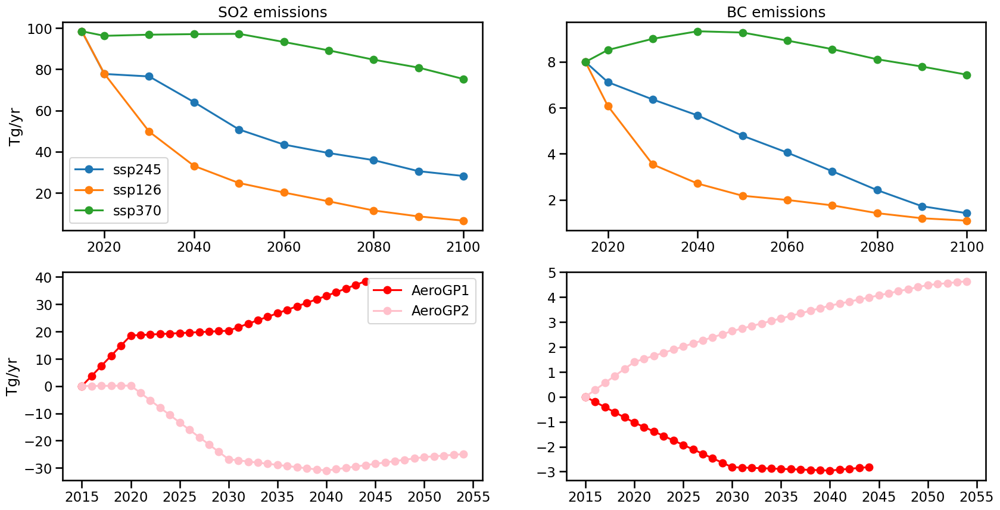

In [7]:
#plot original experimment net global emissions in first row and emission change in second row
with sns.plotting_context('talk'):
    fig, axes = plt.subplots(2, 2, figsize=(20, 10))
    
    grid_a = area_grid(so2_126.lat, so2_126.lon)
    axes[0,0].plot(so2_245.year, (so2_245*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp245',marker='o')
    axes[0,0].plot(so2_126.year, (so2_126*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp126',marker='o')
    axes[0,0].plot(so2_370.year, (so2_370*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp370',marker='o')
    axes[0,0].legend()
    axes[0,0].set_ylabel('Tg/yr')
    axes[0,0].set_title('SO2 emissions')

    axes[0,1].plot(bc_245.year, (bc_245*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp245',marker='o')
    axes[0,1].plot(bc_126.year, (bc_126*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp126',marker='o')
    axes[0,1].plot(bc_370.year, (bc_370*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp370',marker='o')
    axes[0,1].set_title('BC emissions')

    axes[1,0].plot(gp1_ds.year, gp1_ds.SO2.sum(['lat','lon']), label='AeroGP1',marker='o',color='red')
    axes[1,0].plot(gp2_ds.year, gp2_ds.SO2.sum(['lat','lon']), label='AeroGP2',marker='o', color='pink')
    axes[1,0].legend()
    axes[1,0].set_ylabel('Tg/yr')

    axes[1,1].plot(gp1_ds.year, gp1_ds.BC.sum(['lat','lon']), label='AeroGP1',marker='o',color='red')
    axes[1,1].plot(gp2_ds.year, gp2_ds.BC.sum(['lat','lon']), label='AeroGP2',marker='o', color='pink')
    

In [27]:
#outputs:

#baseline (ssp245):
ssp245_r1 = xr.open_mfdataset(glob(in_dp + 'AeroGP/tas_Amon_NorESM2-LM_ssp245_r1i1p1f1_gn_*.nc'))['tas'].groupby('time.year').mean(skipna=True).rename('tas')
ssp245_r2 = xr.open_mfdataset(glob(in_dp + 'AeroGP/tas_Amon_NorESM2-LM_ssp245_r2i1p1f1_gn_*.nc'))['tas'].groupby('time.year').mean(skipna=True).rename('tas')
ssp245_r3 = xr.open_mfdataset(glob(in_dp + 'AeroGP/tas_Amon_NorESM2-LM_ssp245_r3i1p1f1_gn_*.nc'))['tas'].groupby('time.year').mean(skipna=True).rename('tas')
ssp245_tas = xr.concat([ssp245_r1, ssp245_r2, ssp245_r3], dim='ensemble').assign_attrs(units='K', experiment_id='ssp245')
ssp245_mean = ssp245_tas.mean('ensemble') #baseline (ssp245)
ssp245_var = ssp245_tas.var('ensemble') #baseline variance


#aerogp1
agp1_r1_tas = xr.open_mfdataset(glob('/proj/bolinc/users/x_maude/NorESM2/noresm2_out/cesm_archive/aerogp1_r1/atm/hist/aerogp1_r1.cam.h0*.nc'))['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2044)).rename('tas')
agp1_r2_tas = xr.open_mfdataset(glob('/proj/bolinc/users/x_maude/NorESM2/noresm2_out/cesm_archive/agp1_r2/atm/hist/agp1_r2.cam.h0*.nc'))['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2044)).rename('tas')
agp1_org = xr.concat([agp1_r1_tas, agp1_r2_tas], dim='ensemble').assign_attrs(units='K', experiment_id='AeroGP1')
agp1_mean = agp1_org.mean('ensemble') #AeroGP1 mean
agp1_var = agp1_org.var('ensemble') #AeroGP1 variance

#aerogp2
agp2_r1_tas = xr.open_mfdataset(glob('/proj/bolinc/users/x_maude/NorESM2/noresm2_out/cesm_archive/agp2_r1/atm/hist/agp2_r1.cam.h0*.nc'))['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2054)).rename('tas')
agp2_r2_tas = xr.open_mfdataset(glob('/proj/bolinc/users/x_maude/NorESM2/noresm2_out/cesm_archive/agp2_r2/atm/hist/agp2_r2.cam.h0*.nc'))['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2054)).rename('tas')
agp2_org = xr.concat([agp2_r1_tas, agp2_r2_tas], dim='ensemble').assign_attrs(units='K', experiment_id='AeroGP2')
agp2_mean = agp2_org.mean('ensemble') #AeroGP2 mean
agp2_var = agp2_org.var('ensemble') #AeroGP2 variance

agp1_tas = agp1_mean - ssp245_mean #change in tas experiment 1
agp1_tas_var = agp1_var + ssp245_var #variance of tas change
agp1_out = xr.merge([agp1_tas.rename('tas_diff'), agp1_tas_var.rename('diff_var')])

agp2_tas = agp2_mean - ssp245_mean #change in tas experiment 2
agp2_tas_var = agp2_var + ssp245_var #variance of tas change
agp2_out = xr.merge([agp2_tas.rename('tas_diff'), agp2_tas_var.rename('diff_var')])

#assign attributes and save outputs
agp1_out = agp1_out.assign_attrs(units = 'K', experiment_id = 'AeroGP1')
agp2_out = agp2_out.assign_attrs(units = 'K', experiment_id = 'AeroGP2')

if write_files:
    agp1_out.to_netcdf(out_dp + 'outputs_AeroGP1.nc')
    agp2_out.to_netcdf(out_dp + 'outputs_AeroGP2.nc')


In [ ]:
#output stats:

#t-test and t-test with false detection control, with 20 year window from end of time series:
agp1_dec_ds = welch_ttest_fdr(agp1_mean, ssp245_mean).assign_attrs(experiment_id = 'AeroGP1')
agp2_dec_ds = welch_ttest_fdr(agp2_mean, ssp245_mean).assign_attrs(experiment_id = 'AeroGP2')

if write_files:
    agp1_dec_ds.to_netcdf(out_dp + 'stats_fdc_AeroGP1.nc')
    agp2_dec_ds.to_netcdf(out_dp + 'stats_fdc_AeroGP2.nc')


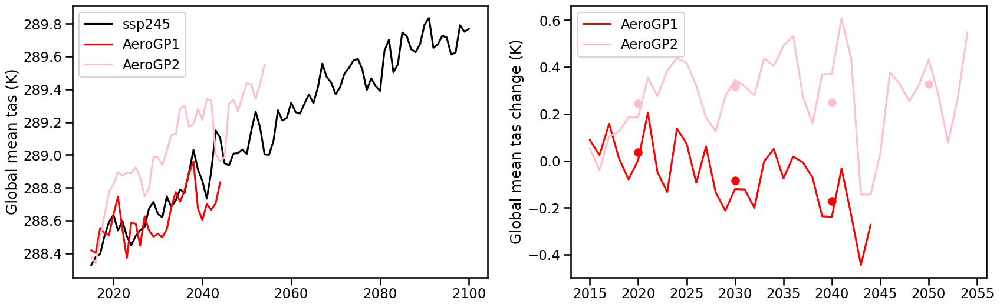

In [16]:
#plot global mean tas, differences

#left hand side is ensemble mean tas
# right hand side is the global averae of the difference in decdal mean ensemble tas between the perturbation and baseline


with sns.plotting_context('talk'):
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))

    axes[0].plot(ssp245_mean.year, lat_weighted_mean(ssp245_mean), label='ssp245', color='k')
    axes[0].plot(agp1_mean.year, lat_weighted_mean(agp1_mean), label='AeroGP1', color='r')
    axes[0].plot(agp2_mean.year, lat_weighted_mean(agp2_mean), label='AeroGP2', color='pink')
    axes[0].set_ylabel('Global mean tas (K)')
    axes[0].legend()

    axes[1].plot(agp1_tas.year, lat_weighted_mean(agp1_out['tas_diff']), label='AeroGP1', color='r')
    axes[1].plot(agp2_tas.year, lat_weighted_mean(agp2_out['tas_diff']), label='AeroGP2', color='pink')
    axes[1].set_ylabel('Global mean tas change (K)')
    axes[1].legend()

    axes[1].scatter([2020,2030,2040], lat_weighted_mean(agp1_dec_ds['tas_diff']), color='r', marker='o')
    axes[1].scatter([2020,2030,2040,2050], lat_weighted_mean(agp2_dec_ds['tas_diff']), color='pink', marker='o')

#plot global mean tas, differences

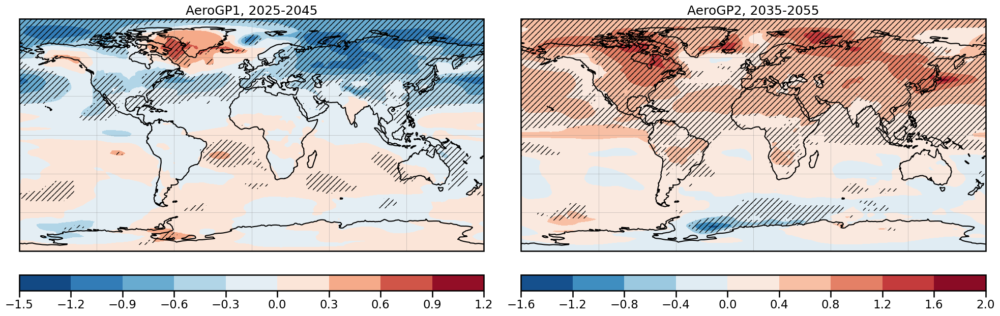

In [33]:
#output significance maps

agp1mask = np.ma.masked_greater(agp1_dec_ds['fdr_adjusted_p_values'][0], 0.05)
agp2mask = np.ma.masked_greater(agp2_dec_ds['fdr_adjusted_p_values'][0], 0.05)
lons = agp1_dec_ds['lon'].values
lats = agp1_dec_ds['lat'].values

agp1_data, lons_ = add_cyclic_point(agp1_tas.sel(year=slice(2025,2045)).mean('year').values, coord=lons)
agp2_data, lons_ = add_cyclic_point(agp2_tas.sel(year=slice(2035,2055)).mean('year').values, coord=lons)

transform = ccrs.PlateCarree()

with sns.plotting_context('talk'):
    fig, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 10))

    #levels = np.linspace(-0.8, 2.8, 10)

    c1 = axs[0].contourf(lons_, lats, agp1_data, transform=transform, cmap='RdBu_r', norm=mpl.colors.TwoSlopeNorm(0))
    axs[0].pcolor(lons_, lats, agp1mask, hatch='///', alpha=0.)

    c2 = axs[1].contourf(lons_, lats, agp2_data, transform=transform, cmap='RdBu_r', norm=mpl.colors.TwoSlopeNorm(0))
    axs[1].pcolor(lons_, lats, agp2mask, hatch='///', alpha=0.)

    for ax,c,exp in zip(axs.flat,[c1, c2],['AeroGP1, 2025-2045','AeroGP2, 2035-2055']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=30)
        #cb.ax.tick_params(labelsize=16)
        ax.set_title(exp)

    fig.tight_layout()

# RAMIP
Aerosols reduced to ssp126 while baseline is ssp370, one perturbation globally and 4 regionally: East Aisa, South Asia, Africa, and the Middle East  \
Available for years 2015-2065
Laura Wilcox et al. 2022 https://doi.org/10.5194/gmd-2022-249


In [ ]:
#inputs: baseline is ssp370, perturbation is ssp126
#RAMIP NorESM years available: 2015-2064
#reuse regridding setup from above
#setup regridder for ScenarioMIP emissions data (emissions are denser than NorESM, we want pixel-for-pixel matching between inputs and outputs)
#noresm2_grid = xr.open_dataset(in_dp + 'RAMIP/ramip_t1_1.0_TREFHT.nc') #example NorESM output
#BC_grid = xr.open_dataset(in_dp + 'RAMIP/BC-em-anthro_input4MIPs_emissions_RAMIP-AF-1-1_gn_201501-210012.nc') #example emissions input

#SMIP_regridder = xe.Regridder(get_bounds(BC_grid), get_bounds(noresm2_grid), 'conservative', periodic=True) #conservative regridding is monotonic (same min/max values) and preserves the integral (value of destination cell is the weighted sum of overlaping source cells with weights determined by amount of overlap)

#grid_area = area_grid(noresm2_grid.lat, noresm2_grid.lon) #area of each grid cell in m^2


In [23]:
#get input data:
so2_126 = xr.open_dataset(in_dp + 'RAMIP/ssp126/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_370 = xr.open_dataset(in_dp + 'RAMIP/ssp370/SO2-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-AIM-ssp370-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_AF = xr.open_dataset(in_dp + 'RAMIP/SO2-em-anthro_input4MIPs_emissions_RAMIP-AF-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_SA = xr.open_dataset(in_dp + 'RAMIP/SO2-em-anthro_input4MIPs_emissions_RAMIP-SA-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_EA = xr.open_dataset(in_dp + 'RAMIP/SO2-em-anthro_input4MIPs_emissions_RAMIP-EA-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
so2_NAE = xr.open_dataset(in_dp + 'RAMIP/SO2-em-anthro_input4MIPs_emissions_RAMIP-NAE-1-1_gn_201501-210012.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()

bc_126 = xr.open_dataset(in_dp + 'RAMIP/ssp126/BC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_370 = xr.open_dataset(in_dp + 'RAMIP/ssp370/BC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-AIM-ssp370-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_AF = xr.open_dataset(in_dp + 'RAMIP/BC-em-anthro_input4MIPs_emissions_RAMIP-AF-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_SA = xr.open_dataset(in_dp + 'RAMIP/BC-em-anthro_input4MIPs_emissions_RAMIP-SA-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_EA = xr.open_dataset(in_dp + 'RAMIP/BC-em-anthro_input4MIPs_emissions_RAMIP-EA-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()
bc_NAE = xr.open_dataset(in_dp + 'RAMIP/BC-em-anthro_input4MIPs_emissions_RAMIP-NAE-1-1_gn_201501-210012.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()

oc_126 = xr.open_dataset(in_dp + 'RAMIP/ssp126/OC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-IMAGE-ssp126-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()
oc_370 = xr.open_dataset(in_dp + 'RAMIP/ssp370/OC-em-anthro_input4MIPs_emissions_ScenarioMIP_IAMC-AIM-ssp370-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()
oc_AF = xr.open_dataset(in_dp + 'RAMIP/OC-em-anthro_input4MIPs_emissions_RAMIP-AF-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()
oc_SA = xr.open_dataset(in_dp + 'RAMIP/OC-em-anthro_input4MIPs_emissions_RAMIP-SA-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()
oc_EA = xr.open_dataset(in_dp + 'RAMIP/OC-em-anthro_input4MIPs_emissions_RAMIP-EA-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()
oc_NAE = xr.open_dataset(in_dp + 'RAMIP/OC-em-anthro_input4MIPs_emissions_RAMIP-NAE-1-1_gn_201501-210012.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()

In [24]:
#make training data inputs (perturbation - baseline)
#interpolate to yearly (original data is every 5 years)
#merge species into one dataset per experiment

#ssp126-ssp370 (t1)
so2_t1 = SMIP_regridder(so2_126-so2_370).interp(year=list(range(2015, 2065)),method='linear').rename('SO2')
bc_t1 = SMIP_regridder(bc_126-bc_370).interp(year=list(range(2015, 2065)),method='linear').rename('BC')
oc_t1 = SMIP_regridder(oc_126-oc_370).interp(year=list(range(2015, 2065)),method='linear').rename('OC')
t1_ds = xr.merge([so2_t1, bc_t1, oc_t1])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#AF
so2_af = SMIP_regridder(so2_AF-so2_370).interp(year=list(range(2015, 2065)),method='linear').rename('SO2')
bc_af = SMIP_regridder(bc_AF-bc_370).interp(year=list(range(2015, 2065)),method='linear').rename('BC')
oc_af = SMIP_regridder(oc_AF-oc_370).interp(year=list(range(2015, 2065)),method='linear').rename('OC')
af_ds = xr.merge([so2_af, bc_af, oc_af])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#SA
so2_sa = SMIP_regridder(so2_SA-so2_370).interp(year=list(range(2015, 2065)),method='linear').rename('SO2')
bc_sa = SMIP_regridder(bc_SA-bc_370).interp(year=list(range(2015, 2065)),method='linear').rename('BC')
oc_sa = SMIP_regridder(oc_SA-oc_370).interp(year=list(range(2015, 2065)),method='linear').rename('OC')
sa_ds = xr.merge([so2_sa, bc_sa, oc_sa])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#EA
so2_ea = SMIP_regridder(so2_EA-so2_370).interp(year=list(range(2015, 2065)),method='linear').rename('SO2')
bc_ea = SMIP_regridder(bc_EA-bc_370).interp(year=list(range(2015, 2065)),method='linear').rename('BC')
oc_ea = SMIP_regridder(oc_EA-oc_370).interp(year=list(range(2015, 2065)),method='linear').rename('OC')
ea_ds = xr.merge([so2_ea, bc_ea, oc_ea])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

#NAE
so2_nae = SMIP_regridder(so2_NAE-so2_370).interp(year=list(range(2015, 2065)),method='linear').rename('SO2')
bc_nae = SMIP_regridder(bc_NAE-bc_370).interp(year=list(range(2015, 2065)),method='linear').rename('BC')
oc_nae = SMIP_regridder(oc_NAE-oc_370).interp(year=list(range(2015, 2065)),method='linear').rename('OC')
nae_ds = xr.merge([so2_nae, bc_nae, oc_nae])*grid_area*SECONDS_IN_YEAR*1e-9 #merge and convert units to Tg/yr

/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable OC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: U

In [9]:
#check SMIP_rigridder is working, global sum should be conserved (difference should be correct):
print('Regridded SO2 126: ',  ((SMIP_regridder(so2_126))*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

org_grid = area_grid(so2_126.lat, so2_126.lon)
print('Original SO2 126: ',  (so2_126*org_grid*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

print('Regridded SO2 370: ',  ((SMIP_regridder(so2_370))*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

print('Difference: ',  (so2_t1.sel(year=[2015,2020,2030,2040,2050,2060])*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

Regridded SO2 126:  [98.43159375 77.85673739 49.67532201 33.04024401 24.73494513 20.11858298
 15.82216309 11.39177698  8.52446632  6.46270519]
Original SO2 126:  [98.42860239 77.8523193  49.67282751 33.03873187 24.73362698 20.11776828
 15.8216518  11.39148363  8.52423027  6.46255497]
Regridded SO2 370:  [98.43159375 96.22229939 96.77523764 97.04887928 97.19381081 93.24731199
 89.15739881 84.63692652 80.79318704 75.26269483]
Difference:  [  0.         -18.36556221 -47.09991537 -64.00863525 -72.45886571
 -73.12872873]


/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(


In [25]:
#assign attributes and save inputs
t1_ds = t1_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'RAMIP T1: ssp126-ssp370')
af_ds = af_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'RAMIP AF')
sa_ds = sa_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'RAMIP SA')
ea_ds = ea_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'RAMIP EA')
nae_ds = nae_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'RAMIP NAE')

if write_files:
    t1_ds.to_netcdf(out_dp+'inputs_ramip_t1.nc')
    af_ds.to_netcdf(out_dp+'inputs_ramip_af.nc')
    sa_ds.to_netcdf(out_dp+'inputs_ramip_sa.nc')
    ea_ds.to_netcdf(out_dp+'inputs_ramip_ea.nc')
    nae_ds.to_netcdf(out_dp+'inputs_ramip_nae.nc')

In [4]:
#outputs baseline:
t0_r1 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r1i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')
t0_r2 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r2i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')
t0_r3 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r3i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')
t0_r4 = xr.open_mfdataset(in_dp + 'RAMIP/ramip_t0*.nc', combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean().sel(year=slice(2015, 2064)).rename('tas')

t0_combined = xr.concat([t0_r4, t0_r1, t0_r2, t0_r3], dim='realization')
t0_mean = t0_combined.mean(dim='realization',skipna=True) #baseline (ssp370)
t0_var = t0_combined.var(dim='realization',skipna=True) #baseline variance

/tmp/ipykernel_2730360/663684818.py:2: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  t0_r1 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r1i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')
/tmp/ipykernel_2730360/663684818.py:3: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  t0_r2 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r2i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')
/tmp/ipykernel_2730360/663684818.py:4: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  t0_r3 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp370_r3i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(2015, 2064)).drop('height')


In [5]:
#outputs
#t1:
t1_combined = xr.open_mfdataset(glob(in_dp + 'RAMIP/ramip_t1_[1-3]*.nc'), combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2064)).rename('tas')
t1_mean = t1_combined.mean(dim='realization',skipna=True) #t1 (global aerosols as ssp126, GHG as ssp370)
t1_var = t1_combined.var(dim='realization',skipna=True)

t1_tas = t1_mean - t0_mean #change in tas experiment 1
t1_tas_var = t1_var + t0_var #variance of tas change
t1_out = xr.merge([t1_tas.rename('tas_diff'), t1_tas_var.rename('diff_var')])


#AF:
af_combined = xr.open_mfdataset(glob(in_dp + 'RAMIP/ramip_t1_AF*.nc'), combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2064)).rename('tas')
af_mean = af_combined.mean(dim='realization',skipna=True) #AF (africal aerosols as ssp126, everywhere else as ssp370)
af_var = af_combined.var(dim='realization',skipna=True)

af_tas = af_mean - t0_mean #change in tas
af_tas_var = af_var + t0_var #variance of tas change
af_out = xr.merge([af_tas.rename('tas_diff'), af_tas_var.rename('diff_var')])


#SA:
sa_combined = xr.open_mfdataset(glob(in_dp + 'RAMIP/ramip_t1_SA*.nc'), combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2064)).rename('tas')
sa_mean = sa_combined.mean(dim='realization',skipna=True) #SA (south asia aerosols as ssp126, everywhere else as ssp370)
sa_var = sa_combined.var(dim='realization',skipna=True)

sa_tas = sa_mean - t0_mean #change in tas
sa_tas_var = sa_var + t0_var #variance of tas change
sa_out = xr.merge([sa_tas.rename('tas_diff'), sa_tas_var.rename('diff_var')])


#EA:
ea_combined = xr.open_mfdataset(glob(in_dp + 'RAMIP/ramip_t1_EA*.nc'), combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2064)).rename('tas')
ea_mean = ea_combined.mean(dim='realization',skipna=True) #EA (east asia aerosols as ssp126, everywhere else as ssp370)
ea_var = ea_combined.var(dim='realization',skipna=True)

ea_tas = ea_mean - t0_mean #change in tas
ea_tas_var = ea_var + t0_var #variance of tas change
ea_out = xr.merge([ea_tas.rename('tas_diff'), ea_tas_var.rename('diff_var')])


#NAE:
nae_combined = xr.open_mfdataset(glob(in_dp + 'RAMIP/ramip_t1_NAE*.nc'), combine='nested', concat_dim='realization')['TREFHT'].groupby('time.year').mean(skipna=True).sel(year=slice(2015,2064)).rename('tas')
nae_mean = nae_combined.mean(dim='realization',skipna=True) #NAE (north africa and europe aerosols as ssp126, everywhere else as ssp370)
nae_var = nae_combined.var(dim='realization',skipna=True)

nae_tas = nae_mean - t0_mean #change in tas
nae_tas_var = nae_var + t0_var #variance of tas change
nae_out = xr.merge([nae_tas.rename('tas_diff'), nae_tas_var.rename('diff_var')])


In [6]:
#assign attributes and save outputs
t1_out = t1_out.assign_attrs(units = 'K', experiment_id = 'RAMIP T1')
af_out = af_out.assign_attrs(units = 'K', experiment_id = 'RAMIP AF')
sa_out = sa_out.assign_attrs(units = 'K', experiment_id = 'RAMIP SA')
ea_out = ea_out.assign_attrs(units = 'K', experiment_id = 'RAMIP EA')
nae_out = nae_out.assign_attrs(units = 'K', experiment_id = 'RAMIP NAE')

if write_files:
    nae_out.to_netcdf(out_dp+'outputs_ramip_nae.nc')
    ea_out.to_netcdf(out_dp+'outputs_ramip_ea.nc')
    sa_out.to_netcdf(out_dp+'outputs_ramip_sa.nc')
    af_out.to_netcdf(out_dp+'outputs_ramip_af.nc')
    t1_out.to_netcdf(out_dp+'outputs_ramip_t1.nc')

In [ ]:
#calculate and save plotting statistics

#t-test and t-test with false detection control, with 20 year window from end of time series:
t1_dec_ds = welch_ttest_fdr(t1_mean, t0_mean).assign_attrs(experiment_id = 'RAMIP T1')

af_dec_ds = welch_ttest_fdr(af_mean, t0_mean).assign_attrs(experiment_id = 'RAMIP AF')

sa_dec_ds = welch_ttest_fdr(sa_mean, t0_mean).assign_attrs(experiment_id = 'RAMIP SA')

ea_dec_ds = welch_ttest_fdr(ea_mean, t0_mean).assign_attrs(experiment_id = 'RAMIP EA')

nae_dec_ds = welch_ttest_fdr(nae_mean, t0_mean).assign_attrs(experiment_id = 'RAMIP NAE')

if write_files:
    t1_dec_ds.to_netcdf(out_dp + 'stats_fdc_ramip_t1.nc')
    af_dec_ds.to_netcdf(out_dp + 'stats_fdc_ramip_af.nc')
    sa_dec_ds.to_netcdf(out_dp + 'stats_fdc_ramip_sa.nc')
    ea_dec_ds.to_netcdf(out_dp + 'stats_fdc_ramip_ea.nc')
    nae_dec_ds.to_netcdf(out_dp + 'stats_fdc_ramip_nae.nc')



Text(0.5, 1.0, 'Mean difference over decade 2055-2064')

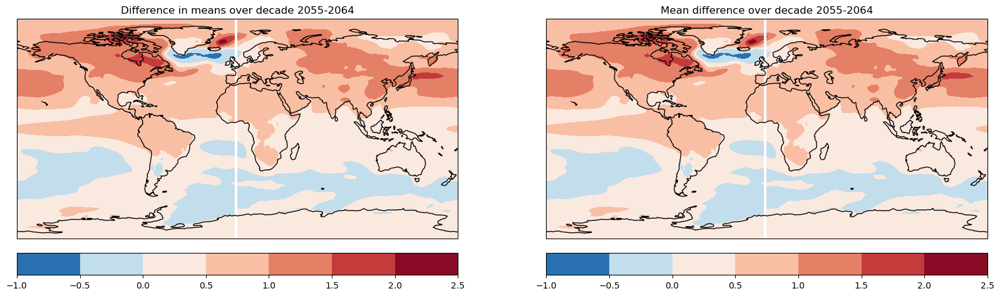

In [ ]:
#some more sanity plots:
fig= plt.figure(figsize=(20, 6))
ax1 = fig.add_subplot(121, projection=ccrs.PlateCarree())
from matplotlib.colors import TwoSlopeNorm
c1=ax1.contourf(t1_combined['lon'], t1_combined['lat'], t1_combined.sel(year=slice(2055,2064)).mean('realization').mean('year')-t0_combined.sel(year=slice(2055,2064)).mean('realization').mean('year'), cmap='RdBu_r', norm=TwoSlopeNorm(0))
ax1.coastlines()
plt.colorbar(c1, ax=ax1, orientation='horizontal', pad=0.05,aspect=20)
ax1.set_title('Difference in means over decade 2055-2064')

ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
c2=ax2.contourf(t1_combined['lon'], t1_combined['lat'], (t1_combined.mean('realization')-t0_combined.mean('realization')).sel(year=slice(2055,2064)).mean('year'), cmap='RdBu_r', norm=TwoSlopeNorm(0))
ax2.coastlines()
plt.colorbar(c2, ax=ax2, orientation='horizontal', pad=0.05,aspect=20)
ax2.set_title('Mean difference over decade 2055-2064')

<>:9: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
<>:9: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
<>:27: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2730360/2920104962.py:9: SyntaxWarning: invalid escape sequence '\D'
  ax1.set_title('$\Delta$T 2055-2064 original stats.')
/tmp/ipykernel_2730360/2920104962.py:19: SyntaxWarning: invalid escape sequence '\D'
  ax2.set_title('$\Delta$T 2045-2064 Welch t-test')
/tmp/ipykernel_2730360/2920104962.py:27: SyntaxWarning: invalid escape sequence '\D'
  ax3.set_title('$\Delta$T 2045-2064 Welch t-test FDR')


Text(0.5, 1.0, '$\\Delta$T 2045-2064 Welch t-test FDR')

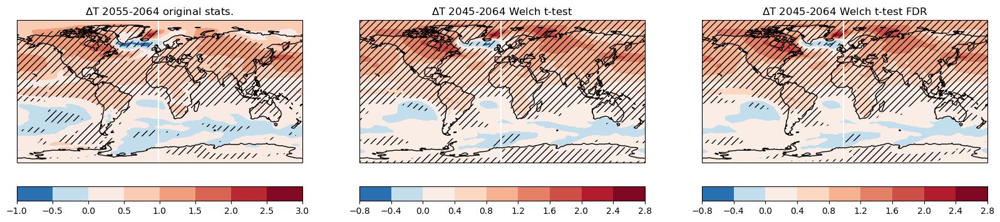

In [ ]:
#some more sanity plots:
fig=plt.figure(figsize=(20, 10))

results = t1_dec_ds
#ax1 = fig.add_subplot(131, projection=ccrs.PlateCarree())
#c1 = ax1.contourf(t1_dec_ds['lon'], t1_dec_ds['lat'], t1_dec_ds['tas_diff'].isel(year_bins=4), cmap='RdBu_r', norm=TwoSlopeNorm(0))
#plt.contourf(t1_dec_ds['lon'], t1_dec_ds['lat'], t1_dec_ds['p_val'].isel(year_bins=4), colors='none', levels=[0,0.05],
#                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
#ax1.coastlines()
#plt.colorbar(c1, ax=ax1, orientation='horizontal', pad=0.05,aspect=20)
#ax1.set_title('$\Delta$T 2055-2064 original stats.')

plt_mean_20yr = (t1_combined.mean('realization')-t0_combined.mean('realization')).sel(year=slice(2045,2064)).mean('year')

ax2 = fig.add_subplot(132, projection=ccrs.PlateCarree())
c2 = ax2.contourf(results['lon'], results['lat'], plt_mean_20yr, cmap='RdBu_r', norm=TwoSlopeNorm(0))
plt.contourf(results['lon'], results['lat'], results['raw_p_values'].isel(window=0), colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
ax2.coastlines()
plt.colorbar(c2, ax=ax2, orientation='horizontal', pad=0.05,aspect=20)
ax2.set_title('$\Delta$T 2045-2064 Welch t-test')

ax3 = fig.add_subplot(133, projection=ccrs.PlateCarree())
c3 = ax3.contourf(results['lon'], results['lat'], plt_mean_20yr, cmap='RdBu_r', norm=TwoSlopeNorm(0))
plt.contourf(results['lon'], results['lat'], results['fdr_adjusted_p_values'].isel(window=0), colors='none', levels=[0,0.05],
                    hatches=['///'], alpha=0., transform=ccrs.PlateCarree())
ax3.coastlines()
plt.colorbar(c3, ax=ax3, orientation='horizontal', pad=0.05,aspect=20)
ax3.set_title('$\Delta$T 2045-2064 Welch t-test FDR')

Text(0, 0.5, 'Global mean tas RAMIP (K)')

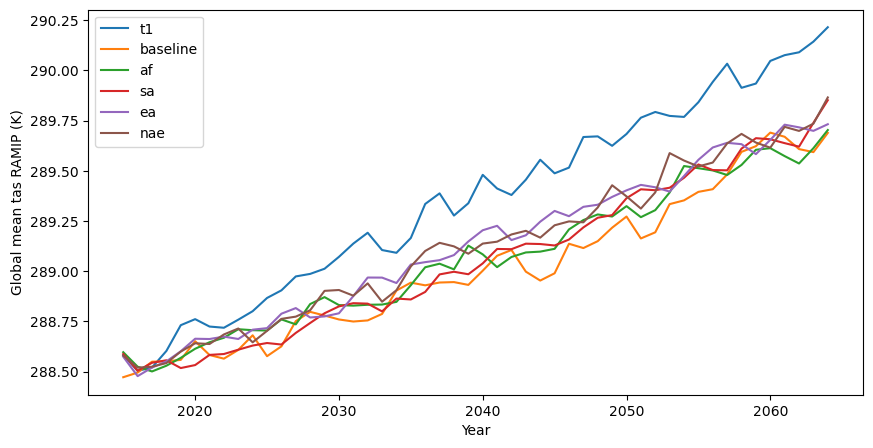

In [15]:
#check global mean tas is correct:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
plt.plot(t1_mean.year, lat_weighted_mean(t1_mean), label='t1')
plt.plot(t0_mean.year, lat_weighted_mean(t0_mean), label='baseline')
plt.plot(af_mean.year, lat_weighted_mean(af_mean), label='af')
plt.plot(sa_mean.year, lat_weighted_mean(sa_mean), label='sa')
plt.plot(ea_mean.year, lat_weighted_mean(ea_mean), label='ea')
plt.plot(nae_mean.year, lat_weighted_mean(nae_mean), label='nae')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Global mean tas RAMIP (K)')

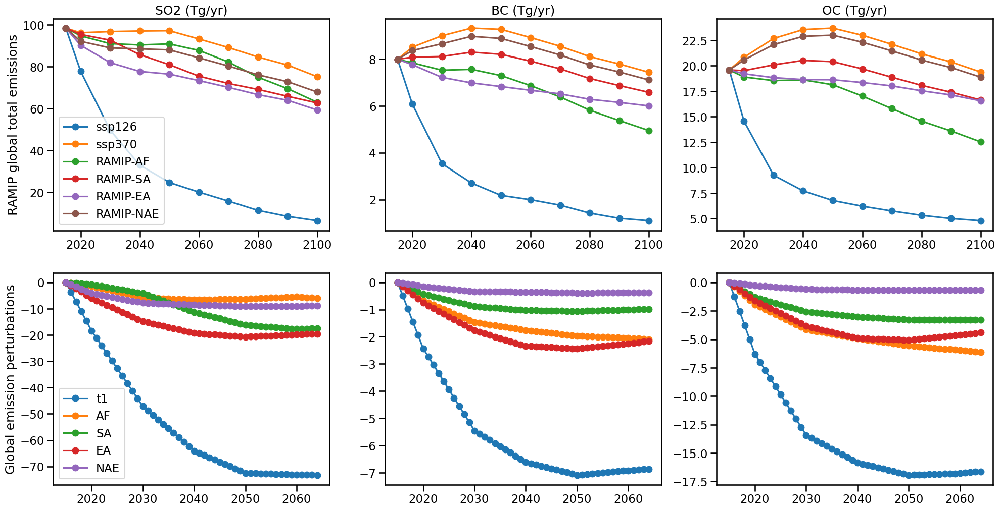

In [24]:
#plot original experimment net global emissions in first row and emission change in second row
with sns.plotting_context('talk'):
    fig, axes = plt.subplots(2, 3, figsize=(24, 12))
    grid_a = area_grid(so2_126.lat, so2_126.lon)

    axes[0,0].plot(so2_126.year, (so2_126*grid_a*SECONDS_IN_YEAR*1e-9).sum(('lon','lat')), label='ssp126',marker='o')
    axes[0,0].plot(so2_370.year, (so2_370*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp370',marker='o')
    axes[0,0].plot(so2_AF.year, (so2_AF*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-AF',marker='o')
    axes[0,0].plot(so2_SA.year, (so2_SA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-SA',marker='o')
    axes[0,0].plot(so2_EA.year, (so2_EA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-EA',marker='o')
    axes[0,0].plot(so2_NAE.year, (so2_NAE*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-NAE',marker='o')
    axes[0,0].set_title('SO2 (Tg/yr)')
    axes[0,0].set_ylabel('RAMIP global total emissions')
    axes[0,0].legend()

    axes[0,1].plot(bc_126.year, (bc_126*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp126',marker='o')
    axes[0,1].plot(bc_370.year, (bc_370*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp370',marker='o')
    axes[0,1].plot(bc_AF.year, (bc_AF*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-AF',marker='o')
    axes[0,1].plot(bc_SA.year, (bc_SA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-SA',marker='o')
    axes[0,1].plot(bc_EA.year, (bc_EA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-EA',marker='o')
    axes[0,1].plot(bc_NAE.year, (bc_NAE*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-NAE',marker='o')
    axes[0,1].set_title('BC (Tg/yr)')

    axes[0,2].plot(oc_126.year, (oc_126*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp126',marker='o')
    axes[0,2].plot(oc_370.year, (oc_370*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='ssp370',marker='o')
    axes[0,2].plot(oc_AF.year, (oc_AF*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-AF',marker='o')
    axes[0,2].plot(oc_SA.year, (oc_SA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-SA',marker='o')
    axes[0,2].plot(oc_EA.year, (oc_EA*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-EA',marker='o')
    axes[0,2].plot(oc_NAE.year, (oc_NAE*grid_a).sum(('lon','lat'))*SECONDS_IN_YEAR*1e-9, label='RAMIP-NAE',marker='o')
    axes[0,2].set_title('OC (Tg/yr)')

    axes[1,0].plot(t1_ds.year, t1_ds.SO2.sum(('lat','lon')), label='t1',marker='o')
    axes[1,0].plot(af_ds.year, af_ds.SO2.sum(('lat','lon')), label='AF',marker='o')
    axes[1,0].plot(sa_ds.year, sa_ds.SO2.sum(('lat','lon')), label='SA',marker='o')
    axes[1,0].plot(ea_ds.year, ea_ds.SO2.sum(('lat','lon')), label='EA',marker='o')
    axes[1,0].plot(nae_ds.year, nae_ds.SO2.sum(('lat','lon')), label='NAE',marker='o')
    axes[1,0].set_ylabel('Global emission perturbations')
    axes[1,0].legend()

    axes[1,1].plot(t1_ds.year, t1_ds.BC.sum(('lat','lon')), label='t1',marker='o')
    axes[1,1].plot(af_ds.year, af_ds.BC.sum(('lat','lon')), label='AF',marker='o')
    axes[1,1].plot(sa_ds.year, sa_ds.BC.sum(('lat','lon')), label='SA',marker='o')
    axes[1,1].plot(ea_ds.year, ea_ds.BC.sum(('lat','lon')), label='EA',marker='o')
    axes[1,1].plot(nae_ds.year, nae_ds.BC.sum(('lat','lon')), label='NAE',marker='o')

    axes[1,2].plot(t1_ds.year, t1_ds.OC.sum(('lat','lon')), label='t1',marker='o')
    axes[1,2].plot(af_ds.year, af_ds.OC.sum(('lat','lon')), label='AF',marker='o')
    axes[1,2].plot(sa_ds.year, sa_ds.OC.sum(('lat','lon')), label='SA',marker='o')
    axes[1,2].plot(ea_ds.year, ea_ds.OC.sum(('lat','lon')), label='EA',marker='o')
    axes[1,2].plot(nae_ds.year, nae_ds.OC.sum(('lat','lon')), label='NAE',marker='o')

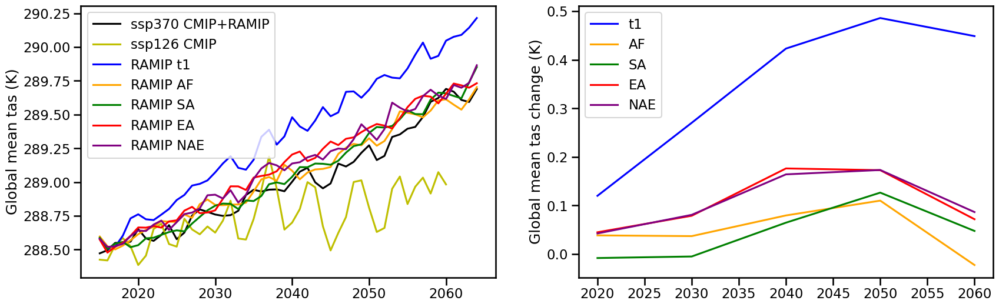

In [36]:
#plot global mean tas, differences, and significance:

#left hand side is ensemble mean tas
# right hand side is the global averae of the difference in decdal mean ensemble tas between the perturbation and baseline
# the crosses indicate where the decadal mean is significantly different from baseline decadal mean

t126 = xr.open_mfdataset(in_dp + 'RAMIP/tas_Amon_NorESM2-LM_ssp126_r1i1p1f1_gn_*.nc', combine='by_coords')['tas'].groupby('time.year').mean(skipna=True).drop('height')

with sns.plotting_context('talk'):
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))

    axes[0].plot(t0_mean.year, lat_weighted_mean(t0_mean), label='ssp370 CMIP+RAMIP', color='k')
    #axes[0].fill_between(t0_mean.year, lat_weighted_mean(t0_mean)-lat_weighted_mean(np.sqrt(t0_var)), lat_weighted_mean(t0_mean)+lat_weighted_mean(np.sqrt(t0_var)), color='k', alpha=0.4)
    axes[0].plot(t126.sel(year=slice(2015,2060)).year, lat_weighted_mean(t126.sel(year=slice(2015,2060))), label='ssp126 CMIP', color='y')

    axes[0].plot(t1_mean.year, lat_weighted_mean(t1_mean), label='RAMIP t1', color='b')
    #axes[0].fill_between(t1_t1_mean.year, t1_t1_mean-t1_t1_std, t1_t1_mean+t1_t1_std, alpha=0.4)
    axes[0].plot(af_mean.year, lat_weighted_mean(af_mean), label='RAMIP AF', color='orange')
    #axes[0].fill_between(t1_af_mean.year, t1_af_mean-t1_af_std, t1_af_mean+t1_af_std, alpha=0.4)
    axes[0].plot(sa_mean.year, lat_weighted_mean(sa_mean), label='RAMIP SA', color='g')
    #axes[0].fill_between(t1_sa_mean.year, t1_sa_mean-t1_sa_std, t1_sa_mean+t1_sa_std, alpha=0.4)
    axes[0].plot(ea_mean.year, lat_weighted_mean(ea_mean), label='RAMIP EA', color='r')
    #axes[0].fill_between(t1_ea_mean.year, t1_ea_mean-t1_ea_std, t1_ea_mean+t1_ea_std, alpha=0.4)
    axes[0].plot(nae_mean.year, lat_weighted_mean(nae_mean), label='RAMIP NAE', color='purple')
    #axes[0].fill_between(t1_nae_mean.year, t1_nae_mean-t1_nae_std, t1_nae_mean+t1_nae_std, alpha=0.4)

    axes[0].set_ylabel('Global mean tas (K)')
    axes[0].legend()

    decades_plotting=xr.DataArray([2020,2030,2040,2050,2060], dims='year')
    axes[1].plot(decades_plotting, lat_weighted_mean(t1_dec_mean), label='t1', color='b') #
   
    axes[1].plot(decades_plotting, lat_weighted_mean(af_dec_mean), label='AF', color='orange')
  
    axes[1].plot(decades_plotting, lat_weighted_mean(sa_dec_mean), label='SA', color='g')

    axes[1].plot(decades_plotting, lat_weighted_mean(ea_dec_mean), label='EA', color='r')

    axes[1].plot(decades_plotting, lat_weighted_mean(nae_dec_mean), label='NAE', color='purple')

    axes[1].set_ylabel('Global mean tas change (K)')
    axes[1].legend()


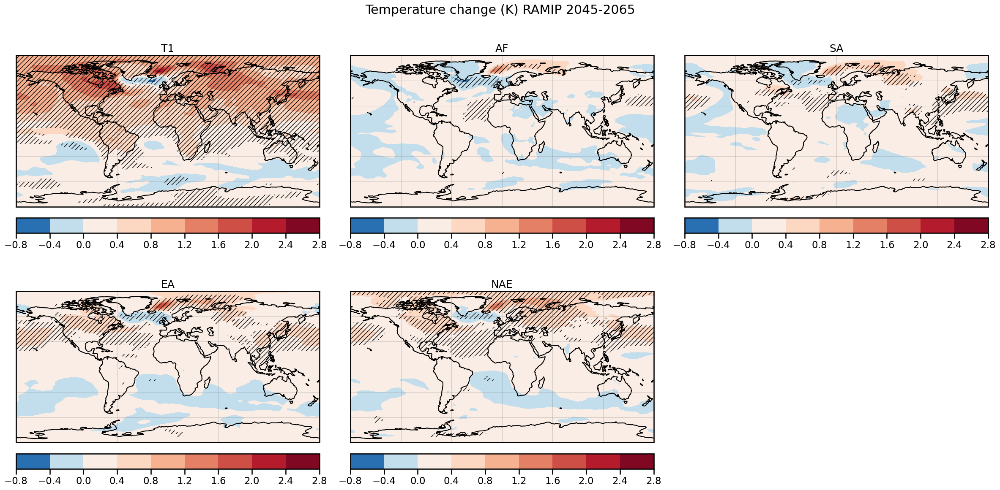

In [26]:
#output significance maps

p1mask = np.ma.masked_greater(t1_dec_ds['fdr_adjusted_p_values'][0], 0.05)
pafmask = np.ma.masked_greater(af_dec_ds['fdr_adjusted_p_values'][0], 0.05)
psamask = np.ma.masked_greater(sa_dec_ds['fdr_adjusted_p_values'][0], 0.05)
peamask = np.ma.masked_greater(ea_dec_ds['fdr_adjusted_p_values'][0], 0.05)
pnaemask = np.ma.masked_greater(nae_dec_ds['fdr_adjusted_p_values'][0], 0.05)

transform = ccrs.PlateCarree()

with sns.plotting_context('talk'):
    fig, axs = plt.subplots(nrows=2, ncols=3, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(24, 12))

    fig.suptitle('Temperature change (K) RAMIP 2045-2065')

    levels = np.linspace(-0.8, 2.8, 10)

    from matplotlib.colors import TwoSlopeNorm
    #n1 = matplotlib.colors.TwoSlopeNorm(vmin=np.nanmin(t1_decade_diff.isel(year_bins=4)), vcenter=0, vmax=np.nanmax(t1_decade_diff.isel(year_bins=4)))

    t1_data, t1_lons = add_cyclic_point(t1_tas.sel(year=slice(2045,2065)).mean('year'), coord=t1_dec_ds['lon'])
    p1_data, x = add_cyclic_point(p1mask, coord=t1_dec_ds['lon'])
    c1 = axs[0,0].contourf(t1_lons, t1_dec_ds['lat'], t1_data, levels=levels, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[0,0].pcolor(t1_lons, t1_dec_ds['lat'], p1_data, transform=transform, hatch='///', alpha=0.)

    af_data, af_lons = add_cyclic_point(af_tas.sel(year=slice(2045,2065)).mean('year'), coord=af_dec_ds['lon'])
    paf_data, x = add_cyclic_point(pafmask, coord=af_dec_ds['lon'])
    c2 = axs[0,1].contourf(af_lons, af_dec_ds['lat'], af_data, levels=levels, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[0,1].pcolor(af_lons, af_dec_ds['lat'], paf_data, transform=transform, hatch='///',alpha=0.)

    sa_data, sa_lons = add_cyclic_point(sa_tas.sel(year=slice(2045,2065)).mean('year'), coord=sa_dec_ds['lon'])
    psa_data, x = add_cyclic_point(psamask, coord=sa_dec_ds['lon'])
    c3 = axs[0,2].contourf(sa_lons, sa_dec_ds['lat'], sa_data, levels=levels, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[0,2].pcolor(sa_lons, sa_dec_ds['lat'], psa_data, transform=transform, hatch='///', alpha=0.)

    ea_data, ea_lons = add_cyclic_point(ea_tas.sel(year=slice(2045,2065)).mean('year'), coord=ea_dec_ds['lon'])
    pea_data, x = add_cyclic_point(peamask, coord=ea_dec_ds['lon'])
    c4 = axs[1,0].contourf(ea_lons, ea_dec_ds['lat'], ea_data, levels=levels, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[1,0].pcolor(ea_lons, ea_dec_ds['lat'], pea_data, transform=transform, hatch='///', alpha=0.)

    nae_data, nae_lons = add_cyclic_point(nae_tas.sel(year=slice(2045,2065)).mean('year'), coord=nae_dec_ds['lon'])
    pnae_data, x = add_cyclic_point(pnaemask, coord=nae_dec_ds['lon'])
    c5 = axs[1,1].contourf(nae_lons, nae_dec_ds['lat'], nae_data, levels=levels, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[1,1].pcolor(nae_lons, nae_dec_ds['lat'], pnae_data, transform=transform, hatch='///', alpha=0.)

    for ax,c,exp in zip(axs.flat,[c1, c2, c3, c4, c5],['T1','AF','SA','EA','NAE']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=20)
        #cb.ax.tick_params(labelsize=16)
        ax.set_title(exp)

    axs[1,2].remove()

    fig.tight_layout()

# DAMIP
hist-aer, ssp245-aer \
original experiment from: https://gmd.copernicus.org/articles/9/3685/2016/ (data publicly available from ESGF)

In [80]:
#setup regridder for CEDS data (pixel-for-pixel matching between inputs and outputs)
ceds_grid = xr.open_dataset(in_dp + '/DAMIP/SO2-em-anthro_input4MIPs_emissions_CMIP_CEDS-2017-05-18_gn_185001-185012.nc')
ceds_regridder = xe.Regridder(get_bounds(ceds_grid), get_bounds(noresm2_grid), 'conservative', periodic=True) #conservative regridding is monotonic (same min/max values) and preserves the integral (value of destination cell is the weighted sum of overlaping source cells with weights determined by amount of overlap)

In [7]:
#hist-aer inputs. 

so2_hist = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/SO2-em-anthro_input4MIPs_emissions_CMIP_CEDS-*.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean().sel(year=slice(1850, None)))
so2_hist = so2_hist.rename('SO2')
bc_hist = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/BC-em-anthro_input4MIPs_emissions_CMIP_CEDS-*.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean().sel(year=slice(1850, None)))
bc_hist = bc_hist.rename('BC')
oc_hist = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/OC-em-anthro_input4MIPs_emissions_CMIP_CEDS-*.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean().sel(year=slice(1850, None)))
oc_hist = oc_hist.rename('OC')

hist_ds = xr.merge([so2_hist,bc_hist,oc_hist], fill_value=0.)
hist_ds = hist_ds*grid_area*SECONDS_IN_YEAR*1e-9 #convert units to Tg/yr
hist_ds = hist_ds - hist_ds.sel(year=1850) #change is relative to 1850.
hist_ds = hist_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'hist-aer')

if write_files:
    hist_ds.to_netcdf(out_dp+'inputs_hist-aer.nc')

/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable OC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(


In [8]:
#ssp245-aer inputs:

so2_245 = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/SO2-em-anthro*ssp245*.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean())
so2_245 = so2_245.rename('SO2')
bc_245 = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/BC-em-anthro_input4MIPs_emissions_ScenarioMIP*ssp245*.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean())
bc_245 = bc_245.rename('BC')
oc_245 = ceds_regridder(xr.open_mfdataset(in_dp+'/DAMIP/OC-em-anthro_input4MIPs_emissions_ScenarioMIP*ssp245*.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean())
oc_245 = oc_245.rename('OC')

years = list(range(2021, 2101))
ssp245_ds = xr.merge([so2_245,bc_245,oc_245], fill_value=0.).interp(year=years,method='linear')

ssp245_ds = ssp245_ds*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
ssp245_ds = ssp245_ds - hist_ds.sel(year=1850) #baseline is 1850
ssp245_ds = ssp245_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'ssp245-aer')

if write_files:
    ssp245_ds.to_netcdf(out_dp+'inputs_ssp245-aer.nc')


/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable OC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(


In [9]:
#check CEDS regridder is working:
print('Regridded SO2 hist: ',  (so2_hist.sel(year=[1850,1900,1950,2000])*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

org_grid2 = area_grid(ceds_grid.lat, ceds_grid.lon)
org_so2 = xr.open_mfdataset(in_dp+'/DAMIP/SO2-em-anthro_input4MIPs_emissions_CMIP_CEDS-*.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()
print('Original SO2 hist: ',  (org_so2.sel(year=[1850,1900,1950,2000])*org_grid2*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')).values)

Regridded SO2 hist:  [  2.46935504  20.57109201  55.84776174 108.90764522]
Original SO2 hist:  [  2.47453696  20.5918087   55.86868234 108.90386517]


In [34]:
#hist-aer outputs:

#baseline piControl:
pi_cont = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_piControl_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(1850, 2100)).drop('height')

#hist-aer:
hist1 = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_hist-aer_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
hist2 = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_hist-aer_r2i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
hist3 = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_hist-aer_r3i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
hist_combined = xr.concat([hist1, hist2, hist3], dim='realization')
hist_mean = hist_combined.mean(dim='realization',skipna=True)
hist_var = hist_combined.var(dim='realization',skipna=True)

hist_tas = hist_mean.sel(year=slice(1850, 2014)) - pi_cont.sel(year=slice(1850, 2014)) #change in tas
hist_tas_var = hist_var.sel(year=slice(1850, 2014)) #variance of tas change (note no variance for piControl at the moment)

hist_out = xr.merge([hist_tas.rename('tas_diff'), hist_tas_var.rename('diff_var')])
hist_out = hist_out.assign_attrs(units = 'K', experiment_id = 'hist-aer')


#ssp245-aer:
ssp245aer = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_ssp245-aer*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
ssp245_tas = ssp245aer - pi_cont.sel(year=slice(2021, 2100)) #change in tas

ssp245_out = xr.merge([ssp245_tas.rename('tas_diff'), xr.zeros_like(ssp245_tas).rename('diff_var')])
ssp245_out = ssp245_out.assign_attrs(units = 'K', experiment_id = 'ssp245-aer')

if write_files:
    hist_out.to_netcdf(out_dp+'outputs_hist-aer.nc')
    ssp245_out.to_netcdf(out_dp+'outputs_ssp245-aer.nc')

/tmp/ipykernel_2730360/3739417559.py:4: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  pi_cont = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_piControl_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).sel(year=slice(1850, 2100)).drop('height')
/tmp/ipykernel_2730360/3739417559.py:7: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  hist1 = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_hist-aer_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
/tmp/ipykernel_2730360/3739417559.py:8: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  hist2 = xr.open_mfdataset(in_dp + '/DAMIP/tas_Amon_NorESM2-LM_hist-aer_r2i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
/tmp/ipykernel_2730360/3739417559.py:9: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  hist3 = xr.open_mfdataset(in_dp 

In [ ]:
#save plotting variables and statistics

#t-test and t-test with false detection control, with 20 year window from end of time series:
hist_dec_ds = welch_ttest_fdr(hist_mean.sel(year=slice(1850, 2014)), pi_cont.sel(year=slice(1850, 2014))).assign_attrs(experiment_id = 'hist-aer')
ssp245_dec_ds = welch_ttest_fdr(ssp245aer, pi_cont.sel(year=slice(2021, 2100))).assign_attrs(experiment_id = 'ssp245-aer')

if write_files:
    hist_dec_ds.to_netcdf(out_dp+'stats_fdc_hist-aer.nc')
    ssp245_dec_ds.to_netcdf(out_dp+'stats_fdc_ssp245-aer.nc')

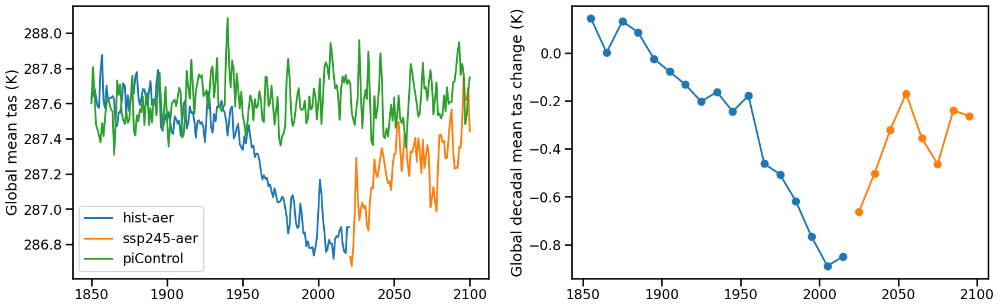

In [76]:
#global mean tas:
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    ax[0].plot(hist_mean.year, lat_weighted_mean(hist_mean), label='hist-aer')
    ax[0].plot(ssp245aer.year, lat_weighted_mean(ssp245aer), label='ssp245-aer')
    ax[0].plot(pi_cont.year, lat_weighted_mean(pi_cont), label='piControl')
    ax[0].legend()
    ax[0].set_ylabel('Global mean tas (K)')

    ax[1].plot(np.arange(1855,2025,10), lat_weighted_mean(hist_dec_ds['tas_diff']), label='hist-aer',marker='o')
    ax[1].plot(np.arange(2025,2105,10), lat_weighted_mean(ssp245_out['tas_diff'].groupby_bins('year', bins=np.arange(2020,2110,10)).mean(skipna=True)), label='ssp245-aer',marker='o')
    ax[1].set_ylabel('Global decadal mean tas change (K)')

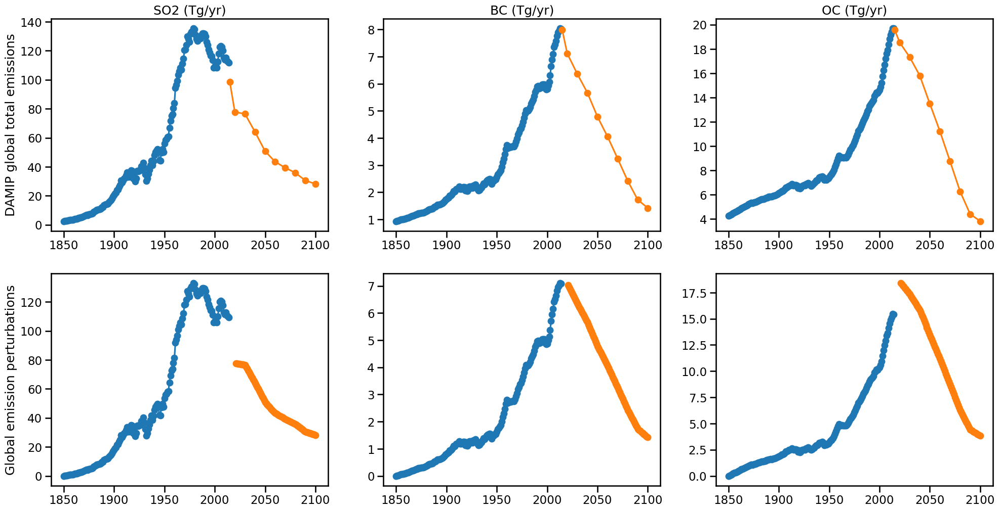

In [13]:
#global net emissions:
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(2, 3, figsize=(24,12))
    ax[0,0].plot(so2_hist.year, (so2_hist*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='hist-aer',marker='o')
    ax[0,0].plot(so2_245.year, (so2_245*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp245-aer',marker='o')
    ax[0,0].set_title('SO2 (Tg/yr)')
    ax[0,0].set_ylabel('DAMIP global total emissions')

    ax[0,1].plot(bc_hist.year, (bc_hist*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='hist-aer',marker='o')
    ax[0,1].plot(bc_245.year, (bc_245*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp245-aer',marker='o')
    ax[0,1].set_title('BC (Tg/yr)')

    ax[0,2].plot(oc_hist.year, (oc_hist*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='hist-aer',marker='o')
    ax[0,2].plot(oc_245.year, (oc_245*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp245-aer',marker='o')
    ax[0,2].set_title('OC (Tg/yr)')
    
    ax[1,0].plot(hist_ds.year, hist_ds.SO2.sum(('lat','lon')), label='hist-aer',marker='o')
    ax[1,0].plot(ssp245_ds.year, ssp245_ds.SO2.sum(('lat','lon')), label='ssp245-aer',marker='o')
    ax[1,0].set_ylabel('Global emission perturbations')

    ax[1,1].plot(hist_ds.year, hist_ds.BC.sum(('lat','lon')), label='hist-aer',marker='o')
    ax[1,1].plot(ssp245_ds.year, ssp245_ds.BC.sum(('lat','lon')), label='ssp245-aer',marker='o')

    ax[1,2].plot(hist_ds.year, hist_ds.OC.sum(('lat','lon')), label='hist-aer',marker='o')
    ax[1,2].plot(ssp245_ds.year, ssp245_ds.OC.sum(('lat','lon')), label='ssp245-aer',marker='o')

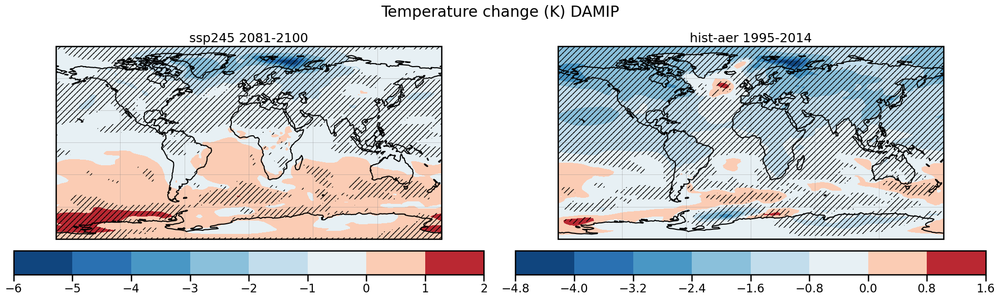

In [40]:
#output maps

histpmask = np.ma.masked_greater(hist_dec_ds['fdr_adjusted_p_values'][0], 0.05)
ssp245pmask = np.ma.masked_greater(ssp245_dec_ds['fdr_adjusted_p_values'][0], 0.05)

with sns.plotting_context('talk'):
    transform = ccrs.PlateCarree()

    fig, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(20, 6))

    fig.suptitle('Temperature change (K) DAMIP')

    from matplotlib.colors import TwoSlopeNorm
    lats = hist_dec_ds['lat']
    lons = hist_dec_ds['lon']

    data1, lons1 = add_cyclic_point(ssp245_tas.sel(year=slice(2081,2100)).mean('year'), coord=lons)
    data2, lons2 = add_cyclic_point(hist_tas.sel(year=slice(1995,2014)).mean('year'), coord=lons)
    data3, lons3 = add_cyclic_point(histpmask, coord=lons)
    data4, lons4 = add_cyclic_point(ssp245pmask, coord=lons)

    c1 = axs[0].contourf(lons1, lats, data1, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[0].pcolor(lons4, lats, data4, hatch='///', alpha=0.)

    c2 = axs[1].contourf(lons2, lats, data2, transform=transform, cmap='RdBu_r', norm=TwoSlopeNorm(0))
    axs[1].pcolor(lons3, lats, data3, transform=transform, hatch='///', alpha=0.)

    for ax,c,exp in zip(axs.flat,[c1, c2],['ssp245 2081-2100','hist-aer 1995-2014']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=20)
        #cb.ax.tick_params(labelsize=16)
        ax.set_title(exp)

    fig.tight_layout()

# AerChemMIP
ssp370-lowNTCF \
original experiment from: https://gmd.copernicus.org/articles/10/585/2017/gmd-10-585-2017.html (data publicly available from ESGF)

In [17]:
#ssp370-NTCF inputs:

so2_NCTF = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/SO2*_AerChemMIP_*.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()).rename('SO2')
bc_NCTF = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/BC*_AerChemMIP_*.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()).rename('BC')
oc_NCTF = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/OC*_AerChemMIP_*.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()).rename('OC')

so2_baseline = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/SO2*_ScenarioMIP_*370*_*.nc')['SO2_em_anthro'].sum('sector').groupby('time.year').mean()).rename('SO2')
bc_baseline = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/BC*_ScenarioMIP_*370*_*.nc')['BC_em_anthro'].sum('sector').groupby('time.year').mean()).rename('BC')
oc_baseline = ceds_regridder(xr.open_mfdataset(in_dp+'/AerChemMIP/OC*_ScenarioMIP_*370*_*.nc')['OC_em_anthro'].sum('sector').groupby('time.year').mean()).rename('OC')

so2_370 = so2_NCTF - so2_baseline
bc_370 = bc_NCTF - bc_baseline
oc_370 = oc_NCTF - oc_baseline

lowNTCF_ds = xr.merge([so2_370,bc_370,oc_370], fill_value=0.).interp(year=list(range(2015, 2055)), method='linear')
lowNTCF_ds = lowNTCF_ds*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
lowNTCF_ds = lowNTCF_ds.assign_attrs(units = 'Tg/yr', experiment_id = 'ssp370-lowNTCF')

if write_files:
    lowNTCF_ds.to_netcdf(out_dp+'inputs_ssp370-NTCF.nc')

/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable BC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable OC_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('lat', 'lon') from data variable SO2_em_anthro as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv/lib/python3.8/site-packages/xesmf/frontend.py:597: U

In [41]:
#outputs:
ssp370_1 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
ssp370_2 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r2i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
ssp370_3 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r3i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')

ssp370_combined = xr.concat([ssp370_1, ssp370_2, ssp370_3], dim='realization')
ssp370_mean = ssp370_combined.mean(dim='realization',skipna=True)
ssp370_var = ssp370_combined.var(dim='realization',skipna=True)

ntcf370_1 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370-lowNTCF_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
ntcf370_2 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370-lowNTCF_r2i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
ntcf370_3 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370-lowNTCF_r3i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')

ntcf370_combined = xr.concat([ntcf370_1, ntcf370_2, ntcf370_3], dim='realization')
ntcf370_mean = ntcf370_combined.mean(dim='realization',skipna=True)
ntcf370_var = ntcf370_combined.var(dim='realization',skipna=True)

ssp370NTCF_tas = ntcf370_mean - ssp370_mean.sel(year=slice(2015,2054)) #change in tas
ssp370NTCF_tas_var = ssp370_var + ntcf370_var #variance of tas change

ssp370NTCF_ds = xr.merge([ssp370NTCF_tas.rename('tas_diff'), ssp370NTCF_tas_var.rename('diff_var')])
ssp370NTCF_ds = ssp370NTCF_ds.assign_attrs(units = 'K', experiment_id = 'ssp370-lowNTCF')

if write_files:
    ssp370NTCF_ds.to_netcdf(out_dp+'outputs_ssp370-NTCF.nc')

/tmp/ipykernel_2730360/2211983295.py:2: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ssp370_1 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r1i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
/tmp/ipykernel_2730360/2211983295.py:3: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ssp370_2 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r2i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
/tmp/ipykernel_2730360/2211983295.py:4: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ssp370_3 = xr.open_mfdataset(in_dp + '/AerChemMIP/tas_Amon_NorESM2-LM_ssp370_r3i1p1f1*.nc')['tas'].groupby('time.year').mean(skipna=True).drop('height')
/tmp/ipykernel_2730360/2211983295.py:10: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ntcf370_1 = xr.open_mfdataset(in_dp + '/AerC

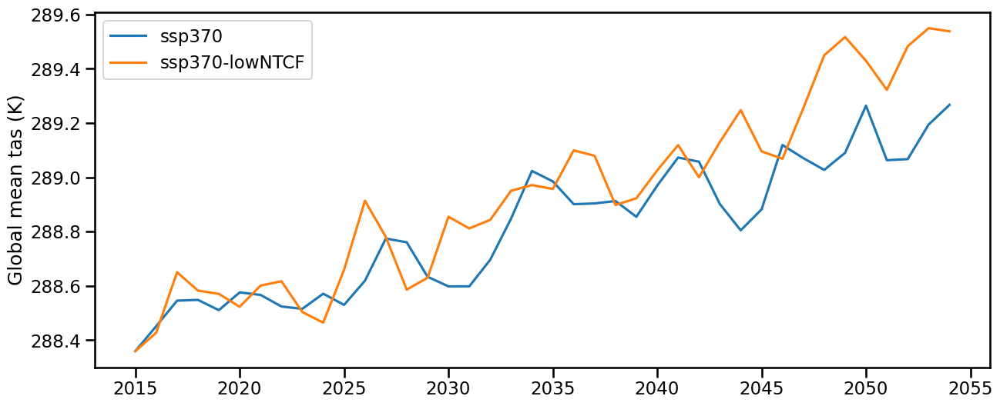

In [52]:
#sanity check global mean tas:

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 1, figsize=(15,6))
    plt.plot(ssp370_mean.sel(year=slice(2015,2054)).year, lat_weighted_mean(ssp370_mean.sel(year=slice(2015,2054))), label='ssp370')
    plt.plot(ntcf370_mean.year, lat_weighted_mean(ntcf370_mean), label='ssp370-lowNTCF')
    plt.legend()
    plt.ylabel('Global mean tas (K)')

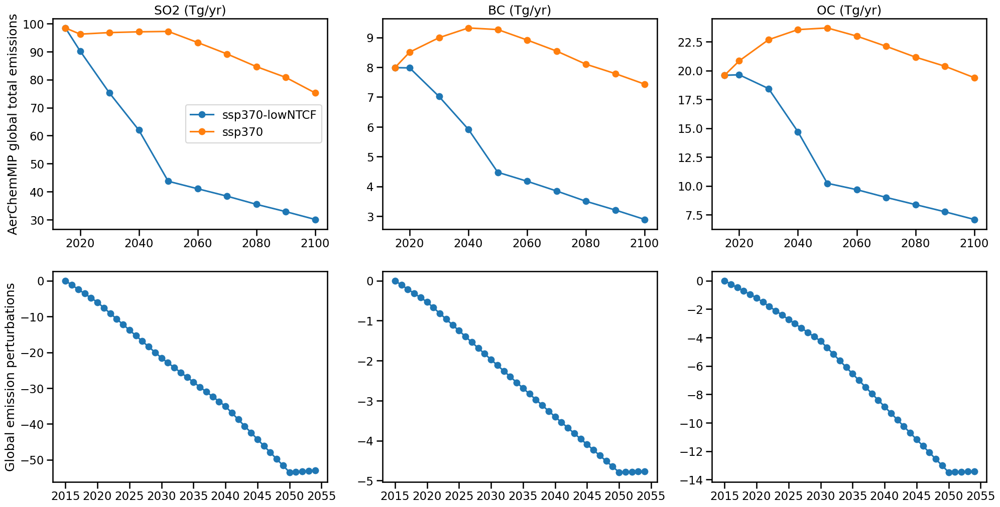

In [32]:
#emissions:

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(2, 3, figsize=(24,12))
    ax[0,0].plot(so2_NCTF.year, (so2_NCTF*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')
    ax[0,0].plot(so2_baseline.year, (so2_baseline*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370',marker='o')
    ax[0,0].legend()
    ax[0,0].set_title('SO2 (Tg/yr)')
    ax[0,0].set_ylabel('AerChemMIP global total emissions')

    ax[0,1].plot(bc_NCTF.year, (bc_NCTF*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')
    ax[0,1].plot(bc_baseline.year, (bc_baseline*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370',marker='o')
    ax[0,1].set_title('BC (Tg/yr)')

    ax[0,2].plot(oc_NCTF.year, (oc_NCTF*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')
    ax[0,2].plot(oc_baseline.year, (oc_baseline*grid_area*SECONDS_IN_YEAR*1e-9).sum(('lat','lon')), label='ssp370',marker='o')
    ax[0,2].set_title('OC (Tg/yr)')
    
    ax[1,0].plot(lowNTCF_ds.year, lowNTCF_ds.SO2.sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')
    ax[1,0].set_ylabel('Global emission perturbations')

    ax[1,1].plot(lowNTCF_ds.year, lowNTCF_ds.BC.sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')

    ax[1,2].plot(lowNTCF_ds.year, lowNTCF_ds.OC.sum(('lat','lon')), label='ssp370-lowNTCF',marker='o')

In [ ]:
#save plotting variables and statistics

#t-test and t-test with false detection control, with 20 year window from end of time series:
ssp370NTCF_dec_ds = welch_ttest_fdr(ntcf370_mean, ssp370_mean.sel(year=slice(2015,2054))).assign_attrs(experiment_id = 'ssp370-lowNTCF')

if write_files:
    ssp370NTCF_dec_ds.to_netcdf(out_dp+'stats_fdc_ssp370-NTCF.nc')

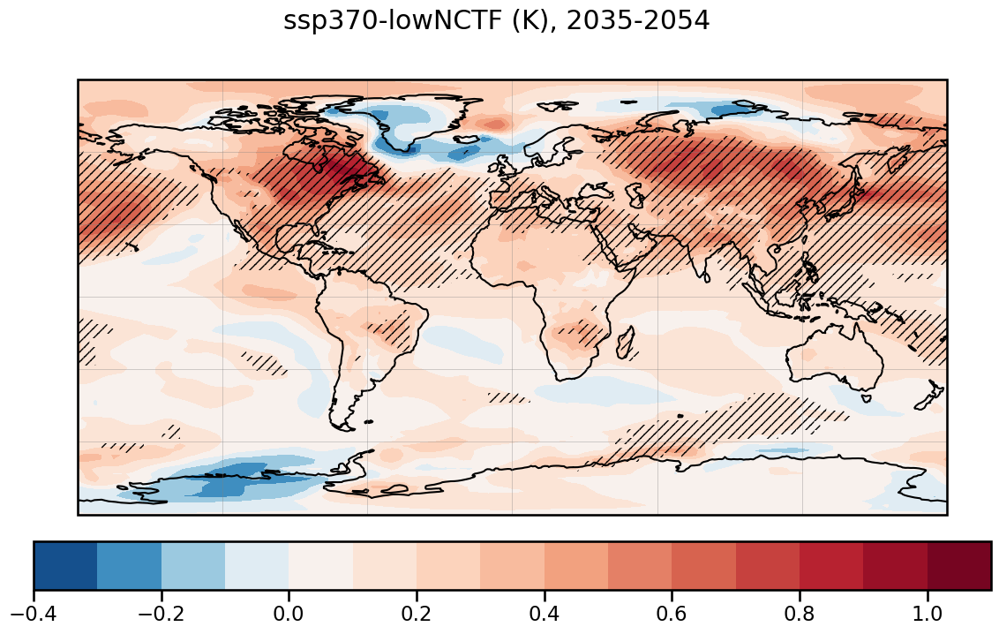

In [44]:
#plot maps of decadal mean and significance:
pNTCFmask = np.ma.masked_greater(ssp370NTCF_dec_ds['fdr_adjusted_p_values'][0], 0.05)
transform = ccrs.PlateCarree()
lats = ssp370NTCF_dec_ds['lat']
lons = ssp370NTCF_dec_ds['lon']


with sns.plotting_context('talk'):
    fig, ax = plt.subplots(nrows=1, ncols=1, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(14, 8))

    data, lons = add_cyclic_point(ssp370NTCF_tas.sel(year=slice(2035,2054)).mean('year'), coord=lons)

    c=ax.contourf(lons, lats, data, transform=transform, cmap='RdBu_r',norm=TwoSlopeNorm(0), levels=16)
    ax.pcolor(lons, lats, pNTCFmask, hatch='///', alpha=0.)

    ax.coastlines()
    ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
    cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=20)
    fig.suptitle('ssp370-lowNCTF (K), 2035-2054')

# SO2 only perturbations
0xEU, 0xEA, 0xSA, 0xNA, 7xEU, 5xNA, 5xEA, 10xSA \
original experiments from: https://acp.copernicus.org/articles/19/2385/2019/ (contact: anna.lewinschal@misu.su.se)

In [15]:
#inputs
#year 2000 baseline inputs
so2_2000 = xr.open_dataset(in_dp + '/SO2only/baseline_2000_SO2NorESM.nc')['EMI_SO2'].mean('time') # time mean

#EAx0:
so2_eu0=xr.open_dataset(in_dp + '/SO2only/0xEU_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
#concat with zeros for other species:
repeat_zeros = xr.zeros_like(so2_eu0)
Zeu_so2=xr.merge([repeat_zeros.rename('BC'),repeat_zeros.rename('OC'),so2_eu0.rename('SO2')])
Zeu_so2 = Zeu_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zeu_so2 = Zeu_so2.rename({'time':'year'})
Zeu_so2.attrs['emission units'] = 'Tg/yr'
Zeu_so2.attrs['experiment_id'] = '0xEU SO2 only'

#EAx0
so2_ea0=xr.open_dataset(in_dp + '/SO2only/0xEA_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
Zea_so2=xr.merge([repeat_zeros.rename('BC'),repeat_zeros.rename('OC'),so2_ea0.rename('SO2')])
Zea_so2 = Zea_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zea_so2 = Zea_so2.rename({'time':'year'})
Zea_so2 = Zea_so2.assign_attrs(units = 'Tg/yr', experiment_id = '0xEA SO2 only')

#NAx0
so2_na0=xr.open_dataset(in_dp + '/SO2only/0xNA_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
Zna_so2=xr.merge([repeat_zeros.rename('BC'),repeat_zeros.rename('OC'),so2_na0.rename('SO2')])
Zna_so2 = Zna_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zna_so2 = Zna_so2.rename({'time':'year'})
Zna_so2 = Zna_so2.assign_attrs(units = 'Tg/yr', experiment_id = '0xNA SO2 only')


#SAx0
so2_sa0=xr.open_dataset(in_dp + '/SO2only/0xSA_SO2_NorESM.nc')['EMI_SO2'].mean('time')- so2_2000
Zsa_so2=xr.merge([repeat_zeros.rename('BC'),repeat_zeros.rename('OC'),so2_sa0.rename('SO2')])
Zsa_so2 = Zsa_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zsa_so2 = Zsa_so2.rename({'time':'year'})
Zsa_so2 = Zsa_so2.assign_attrs(units = 'Tg/yr', experiment_id = '0xSA SO2 only')


#7xEU:
so2_eu7=xr.open_dataset(in_dp + '/SO2only/7xEU_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
repeat_zeros2 = xr.zeros_like(so2_eu7)
Zeu7_so2=xr.merge([repeat_zeros2.rename('BC'),repeat_zeros2.rename('OC'),so2_eu7.rename('SO2')])
Zeu7_so2 = Zeu7_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zeu7_so2 = Zeu7_so2.rename({'time':'year'})
Zeu7_so2 = Zeu7_so2.assign_attrs(units = 'Tg/yr', experiment_id = '7xEU SO2 only')


#5xEA:
so2_ea5=xr.open_dataset(in_dp + '/SO2only/5xEA_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
Zea5_so2=xr.merge([repeat_zeros2.rename('BC'),repeat_zeros2.rename('OC'),so2_ea5.rename('SO2')])
Zea5_so2 = Zea5_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zea5_so2 = Zea5_so2.rename({'time':'year'})
Zea5_so2 = Zea5_so2.assign_attrs(units = 'Tg/yr', experiment_id = '5xEA SO2 only')


#5xNA:
so2_na5=xr.open_dataset(in_dp + '/SO2only/5xNA_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
Zna5_so2=xr.merge([repeat_zeros2.rename('BC'),repeat_zeros2.rename('OC'),so2_na5.rename('SO2')])
Zna5_so2 = Zna5_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zna5_so2 = Zna5_so2.rename({'time':'year'})
Zna5_so2 = Zna5_so2.assign_attrs(units = 'Tg/yr', experiment_id = '5xNA SO2 only')


#10xSA:
so2_sa10=xr.open_dataset(in_dp + '/SO2only/10xSA_SO2_NorESM.nc')['EMI_SO2'].mean('time') - so2_2000
Zsa10_so2=xr.merge([repeat_zeros2.rename('BC'),repeat_zeros2.rename('OC'),so2_sa10.rename('SO2')])
Zsa10_so2 = Zsa10_so2*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
#Zsa10_so2 = Zsa10_so2.rename({'time':'year'})
Zsa10_so2 = Zsa10_so2.assign_attrs(units = 'Tg/yr', experiment_id = '10xSA SO2 only')


if write_files:
    Zeu_so2.to_netcdf(out_dp+'inputs_0xEU_SO2.nc')
    Zea_so2.to_netcdf(out_dp+'inputs_0xEA_SO2.nc')
    Zna_so2.to_netcdf(out_dp+'inputs_0xNA_SO2.nc')
    Zsa_so2.to_netcdf(out_dp+'inputs_0xSA_SO2.nc')
    Zeu7_so2.to_netcdf(out_dp+'inputs_7xEU_SO2.nc')
    Zea5_so2.to_netcdf(out_dp+'inputs_5xEA_SO2.nc')
    Zna5_so2.to_netcdf(out_dp+'inputs_5xNA_SO2.nc')
    Zsa10_so2.to_netcdf(out_dp+'inputs_10xSA_SO2.nc')

In [45]:
#outputs:
baseline_org= xr.open_dataset(in_dp+'/SO2only/baseline_2000_SO2NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
baseline_2000 = baseline_org.mean('year')
baseline_2000_var = baseline_org.var('year')

ea0_org = xr.open_dataset(in_dp+'/SO2only/0xEA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
ea0 = (ea0_org.mean('year')-baseline_org.mean('year')).rename('tas_diff')
ea0_var = ea0_org.var('year') + baseline_2000_var
ea0_ds = xr.merge([ea0,ea0_var.rename('diff_var')])
ea0_ds = ea0_ds.assign_attrs(units = 'K', experiment_id = '0xEA SO2 only')


eu0_org = xr.open_dataset(in_dp+'/SO2only/0xEU_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
eu0 = (eu0_org.mean('year') - baseline_2000).rename('tas_diff')
eu0_var = eu0_org.var('year') + baseline_2000_var
eu0_ds = xr.merge([eu0,eu0_var.rename('diff_var')])
eu0_ds = eu0_ds.assign_attrs(units = 'K', experiment_id = '0xEU SO2 only')


na0_org = xr.open_dataset(in_dp+'/SO2only/0xNA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
na0 = (na0_org.mean('year') - baseline_2000).rename('tas_diff')
na0_var = na0_org.var('year') + baseline_2000_var
na0_ds = xr.merge([na0,na0_var.rename('diff_var')])
na0_ds = na0_ds.assign_attrs(units = 'K', experiment_id = '0xNA SO2 only')


sa0_org = xr.open_dataset(in_dp+'/SO2only/0xSA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
sa0 = (sa0_org.mean('year') - baseline_2000).rename('tas_diff')
sa0_var = sa0_org.var('year') + baseline_2000_var
sa0_ds = xr.merge([sa0,sa0_var.rename('diff_var')])
sa0_ds = sa0_ds.assign_attrs(units = 'K', experiment_id = '0xSA SO2 only')


eu7_org = xr.open_dataset(in_dp+'/SO2only/7xEU_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
eu7 = (eu7_org.mean('year') - baseline_2000).rename('tas_diff')
eu7_var = eu7_org.var('year') + baseline_2000_var
eu7_ds = xr.merge([eu7,eu7_var.rename('diff_var')])
eu7_ds = eu7_ds.assign_attrs(units = 'K', experiment_id = '7xEU SO2 only')


ea5_org = xr.open_dataset(in_dp+'/SO2only/5xEA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
ea5 = (ea5_org.mean('year') - baseline_2000).rename('tas_diff')
ea5_var = ea5_org.var('year') + baseline_2000_var
ea5_ds = xr.merge([ea5,ea5_var.rename('diff_var')])
ea5_ds = ea5_ds.assign_attrs(units = 'K', experiment_id = '5xEA SO2 only')


na5_org = xr.open_dataset(in_dp+'/SO2only/5xNA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
na5 = (na5_org.mean('year') - baseline_2000).rename('tas_diff')
na5_var = na5_org.var('year') + baseline_2000_var
na5_ds = xr.merge([na5,na5_var.rename('diff_var')])
na5_ds = na5_ds.assign_attrs(units = 'K', experiment_id = '5xNA SO2 only')


sa10_org = xr.open_dataset(in_dp+'/SO2only/10xSA_SO2_NorESM.nc')['TREFHT'].groupby('time.year').mean().rename('tas').sel(year=slice(2051,2159))
sa10 = (sa10_org.mean('year') - baseline_2000).rename('tas_diff')
sa10_var = sa10_org.var('year') + baseline_2000_var
sa10_ds = xr.merge([sa10,sa10_var.rename('diff_var')])
sa10_ds = sa10_ds.assign_attrs(units = 'K', experiment_id = '10xSA SO2 only')


if write_files:
    ea0_ds.to_netcdf(out_dp+'outputs_0xEA_SO2.nc')
    eu0_ds.to_netcdf(out_dp+'outputs_0xEU_SO2.nc')
    na0_ds.to_netcdf(out_dp+'outputs_0xNA_SO2.nc')
    sa0_ds.to_netcdf(out_dp+'outputs_0xSA_SO2.nc')
    eu7_ds.to_netcdf(out_dp+'outputs_7xEU_SO2.nc')
    ea5_ds.to_netcdf(out_dp+'outputs_5xEA_SO2.nc')
    na5_ds.to_netcdf(out_dp+'outputs_5xNA_SO2.nc')
    sa10_ds.to_netcdf(out_dp+'outputs_10xSA_SO2.nc')

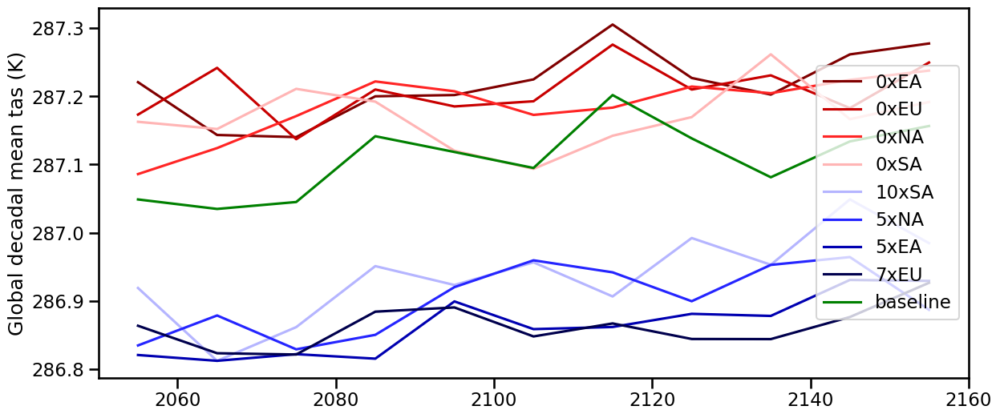

In [63]:
# global mean tas:
year_bins1 = np.arange(2050, 2210, 10)
year_bins2 = np.arange(2050, 2170, 10)

with sns.plotting_context('talk'):
    fig,ax = plt.subplots(1, 1, figsize=(14, 6))
    cmap = mpl.cm.seismic_r
    colors_so2 = cmap(np.linspace(0,1,8))

    plt.plot(year_bins1[0:-1]+5, lat_weighted_mean(ea0_org.groupby_bins('year', bins=year_bins1).mean()), label='0xEA', color=colors_so2[0])
    plt.plot(year_bins1[0:-1]+5, lat_weighted_mean(eu0_org.groupby_bins('year', bins=year_bins1).mean()), label='0xEU', color=colors_so2[1])
    plt.plot(year_bins1[0:-1]+5, lat_weighted_mean(na0_org.groupby_bins('year', bins=year_bins1).mean()), label='0xNA', color=colors_so2[2])
    plt.plot(year_bins1[0:-1]+5, lat_weighted_mean(sa0_org.groupby_bins('year', bins=year_bins1).mean()), label='0xSA', color=colors_so2[3])
    plt.plot(year_bins2[0:-1]+5, lat_weighted_mean(sa10_org.groupby_bins('year', bins=year_bins2).mean()), label='10xSA', color=colors_so2[4])
    plt.plot(year_bins2[0:-1]+5, lat_weighted_mean(na5_org.groupby_bins('year', bins=year_bins2).mean()), label='5xNA', color=colors_so2[5])
    plt.plot(year_bins2[0:-1]+5, lat_weighted_mean(ea5_org.groupby_bins('year', bins=year_bins2).mean()), label='5xEA', color=colors_so2[6])
    plt.plot(year_bins2[0:-1]+5, lat_weighted_mean(eu7_org.groupby_bins('year', bins=year_bins2).mean()), label='7xEU', color=colors_so2[7])
    
    plt.plot(year_bins1[0:-1]+5, lat_weighted_mean(baseline_org.groupby_bins('year', bins=year_bins1).mean()), label='baseline', color='g')
    plt.legend(loc='right')
    plt.ylabel('Global decadal mean tas (K)')

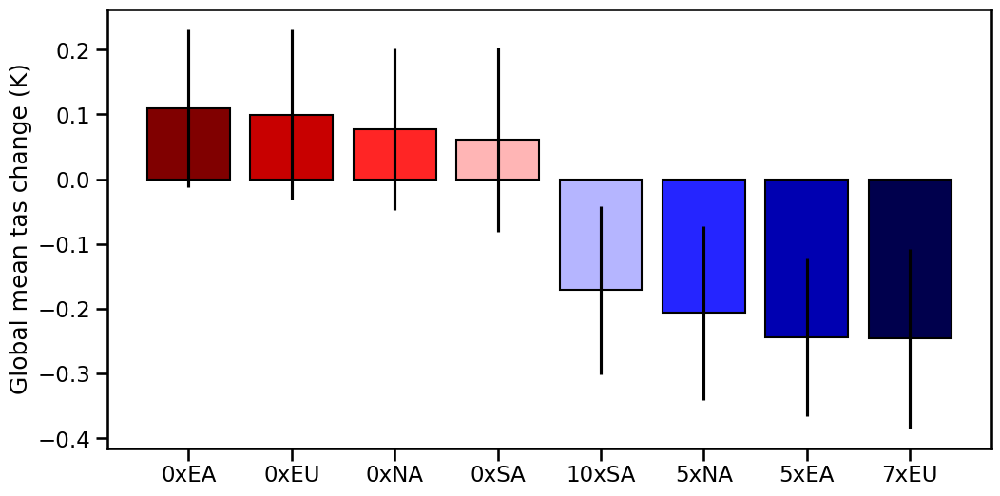

In [64]:
#plot tas change
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(figsize=(12, 6))

    experiments = ['0xEA','0xEU','0xNA','0xSA','10xSA','5xNA','5xEA','7xEU']
    tas_change = [lat_weighted_mean(ea0_ds['tas_diff']), lat_weighted_mean(eu0_ds['tas_diff']), lat_weighted_mean(na0_ds['tas_diff']), lat_weighted_mean(sa0_ds['tas_diff']), lat_weighted_mean(sa10_ds['tas_diff']), lat_weighted_mean(na5_ds['tas_diff']), lat_weighted_mean(ea5_ds['tas_diff']), lat_weighted_mean(eu7_ds['tas_diff'])]
    tas_std = [
        (lat_weighted_mean(ea0_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(eu0_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(na0_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(sa0_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(sa10_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(na5_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(ea5_org)-lat_weighted_mean(baseline_org)).std(),
        (lat_weighted_mean(eu7_org)-lat_weighted_mean(baseline_org)).std()
    ]
    ax.bar(experiments, tas_change, yerr=tas_std, color=colors_so2, edgecolor='black')
    ax.set_ylabel('Global mean tas change (K)')
    #ax.set_title('$SO_{2}$-only perturbations')

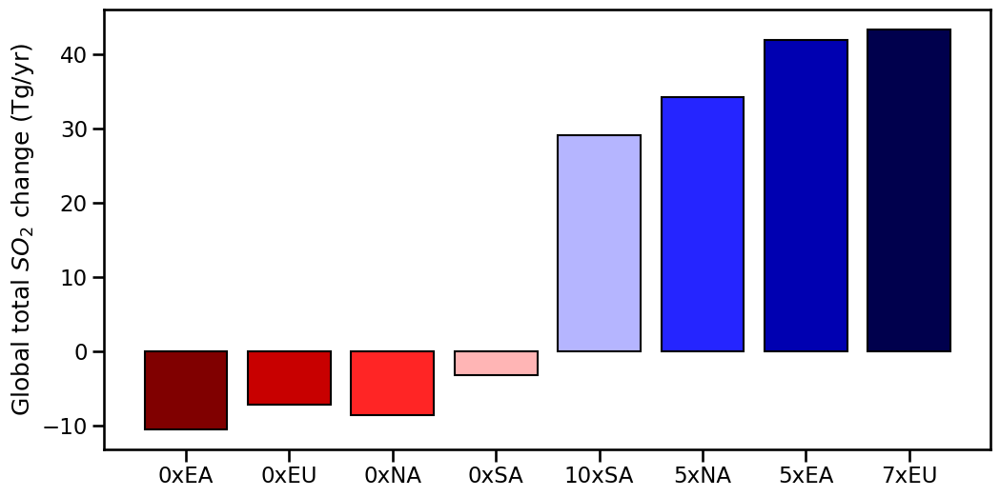

In [65]:
#plot emissions
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(figsize=(12, 6))
    cmap = mpl.cm.seismic_r

    experiments = ['0xEA','0xEU','0xNA','0xSA','10xSA','5xNA','5xEA','7xEU']
    emissions = [Zea_so2.SO2.sum(('lat','lon')), Zeu_so2.SO2.sum(('lat','lon')), Zna_so2.SO2.sum(('lat','lon')), Zsa_so2.SO2.sum(('lat','lon')), Zsa10_so2.SO2.sum(('lat','lon')), Zna5_so2.SO2.sum(('lat','lon')), Zea5_so2.SO2.sum(('lat','lon')), Zeu7_so2.SO2.sum(('lat','lon'))]

    ax.bar(experiments, emissions, color=cmap(np.linspace(0,1,8)), edgecolor='black')
    ax.set_ylabel('Global total $SO_{2}$ change (Tg/yr)')
    #ax.set_title('$SO_{2}$-only perturbations')


In [ ]:
#save plotting variables and statistics

#define function t-test using whoel equilibrium experiment:
def ttest_equilibrium(da1, da2):
    tval, pval = ttest_ind(da1, da2, axis=0, equal_var=False, nan_policy='omit', alternative='two-sided')
    pval_fdr = false_discovery_control(pval, method='bh')
    results= xr.Dataset({
            "raw_p_values": (["lat","lon"], pval),
            "fdr_adjusted_p_values": (["lat","lon"], pval_fdr)
        },
        coords={
            "lat": da1['lat'],
            "lon": da1['lon']
        })
    return results

ea0stats_ds = ttest_equilibrium(ea0_org, baseline_org).assign_attrs(experiment_id = '0xEA SO2 only')
eu0stats_ds = ttest_equilibrium(eu0_org, baseline_org).assign_attrs(experiment_id = '0xEU SO2 only')
na0stats_ds = ttest_equilibrium(na0_org, baseline_org).assign_attrs(experiment_id = '0xNA SO2 only')
sa0stats_ds = ttest_equilibrium(sa0_org, baseline_org).assign_attrs(experiment_id = '0xSA SO2 only')
eu7stats_ds = ttest_equilibrium(eu7_org, baseline_org).assign_attrs(experiment_id = '7xEU SO2 only')
ea5stats_ds = ttest_equilibrium(ea5_org, baseline_org).assign_attrs(experiment_id = '5xEA SO2 only')
na5stats_ds = ttest_equilibrium(na5_org, baseline_org).assign_attrs(experiment_id = '5xNA SO2 only')
sa10stats_ds = ttest_equilibrium(sa10_org, baseline_org).assign_attrs(experiment_id = '10xSA SO2 only')

if write_files:
    ea0stats_ds.to_netcdf(out_dp+'stats_fdc_0xEA_SO2.nc')
    eu0stats_ds.to_netcdf(out_dp+'stats_fdc_0xEU_SO2.nc')
    na0stats_ds.to_netcdf(out_dp+'stats_fdc_0xNA_SO2.nc')
    sa0stats_ds.to_netcdf(out_dp+'stats_fdc_0xSA_SO2.nc')
    eu7stats_ds.to_netcdf(out_dp+'stats_fdc_7xEU_SO2.nc')
    ea5stats_ds.to_netcdf(out_dp+'stats_fdc_5xEA_SO2.nc')
    na5stats_ds.to_netcdf(out_dp+'stats_fdc_5xNA_SO2.nc')
    sa10stats_ds.to_netcdf(out_dp+'stats_fdc_10xSA_SO2.nc')



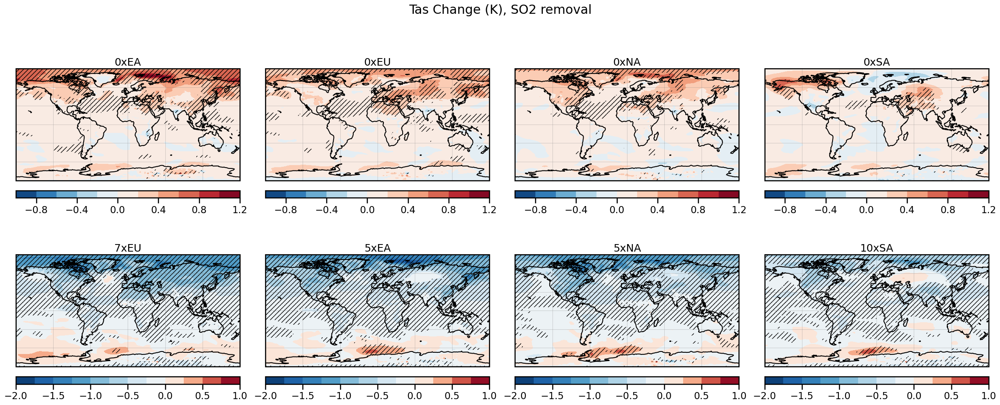

In [49]:
#maps

ea0pmask = np.ma.masked_greater(ea0stats_ds['fdr_adjusted_p_values'], 0.05)
eu0pmask = np.ma.masked_greater(eu0stats_ds['fdr_adjusted_p_values'], 0.05)
na0pmask = np.ma.masked_greater(na0stats_ds['fdr_adjusted_p_values'], 0.05)
sa0pmask = np.ma.masked_greater(sa0stats_ds['fdr_adjusted_p_values'], 0.05)
eu7pmask = np.ma.masked_greater(eu7stats_ds['fdr_adjusted_p_values'], 0.05)
ea5pmask = np.ma.masked_greater(ea5stats_ds['fdr_adjusted_p_values'], 0.05)
na5pmask = np.ma.masked_greater(na5stats_ds['fdr_adjusted_p_values'], 0.05)
sa10pmask = np.ma.masked_greater(sa10stats_ds['fdr_adjusted_p_values'], 0.05)
transform = ccrs.PlateCarree()
lats = ea0_ds['lat']
lons = ea0_ds['lon']
ea0_data, lons_ = add_cyclic_point(ea0_ds['tas_diff'], coord=lons)
eu0_data, lons_ = add_cyclic_point(eu0_ds['tas_diff'], coord=lons)
na0_data, lons_ = add_cyclic_point(na0_ds['tas_diff'], coord=lons)
sa0_data, lons_ = add_cyclic_point(sa0_ds['tas_diff'], coord=lons)
eu7_data, lons_ = add_cyclic_point(eu7_ds['tas_diff'], coord=lons)
ea5_data, lons_ = add_cyclic_point(ea5_ds['tas_diff'], coord=lons)
na5_data, lons_ = add_cyclic_point(na5_ds['tas_diff'], coord=lons)
sa10_data, lons_ = add_cyclic_point(sa10_ds['tas_diff'], coord=lons)


with sns.plotting_context('talk'):
    
    fig, axs = plt.subplots(nrows=2, ncols=4, subplot_kw={'projection': transform}, figsize=(24, 10))

    fig.suptitle('Tas Change (K), SO2 removal')

    levels1=np.linspace(-1.0, 1.2, 12)
    levels2=np.linspace(-2.0, 1.0, 13)

    c1 = axs[0,0].contourf(lons_, lats, ea0_data, levels=levels1, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,0].pcolor(lons_, lats, ea0pmask, hatch='///', alpha=0.)

    c2 = axs[0,1].contourf(lons_, lats, eu0_data, levels=levels1, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,1].pcolor(lons_, lats, eu0pmask, hatch='///', alpha=0.)

    c3 = axs[0,2].contourf(lons_, lats, na0_data, levels=levels1, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,2].pcolor(lons_, lats, na0pmask, hatch='///', alpha=0.)

    c4 = axs[0,3].contourf(lons_, lats, sa0_data, levels=levels1, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,3].pcolor(lons_, lats, sa0pmask, hatch='///', alpha=0.)

    c5 = axs[1,0].contourf(lons_, lats, eu7_data, levels=levels2, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,0].pcolor(lons_, lats, eu7pmask, hatch='///', alpha=0.)

    c6 = axs[1,1].contourf(lons_, lats, ea5_data, levels=levels2, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,1].pcolor(lons_, lats, ea5pmask, hatch='///', alpha=0.)

    c7 = axs[1,2].contourf(lons_, lats, na5_data, levels=levels2, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,2].pcolor(lons_, lats, na5pmask, hatch='///', alpha=0.)

    c8 = axs[1,3].contourf(lons_, lats, sa10_data, levels=levels2, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,3].pcolor(lons_, lats, sa10pmask, hatch='///', alpha=0.)

    for ax,c,exp in zip(axs.flat,[c1, c2, c3, c4, c5, c6, c7, c8],['0xEA','0xEU','0xNA','0xSA','7xEU','5xEA','5xNA','10xSA']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05, aspect=30)
        #cb.ax.tick_params(labelsize=16)
        ax.set_title(exp)

fig.tight_layout()

# BC only perturbations
5xEA, 10xEU, 10xNA, 10xSA \
original experiments from: https://acp.copernicus.org/articles/20/3079/2020/ (contact: maria.sand@cicero.oslo.no)

In [53]:
#inputs

bc10eu = xr.open_mfdataset(in_dp + '/BConly/N2000_10xBCemEU_*.yearlymean.2050-2099.nc',combine='nested',concat_dim='ensemble_member').sel(time=slice('2050-01-01','2099-12-31'))
bc10na = xr.open_mfdataset(in_dp + '/BConly/N2000_10xBCemNA_*.yearlymean.2050-2099.nc',combine='nested',concat_dim='ensemble_member').sel(time=slice('2050-01-01','2099-12-31'))
bc10sa = xr.open_mfdataset(in_dp + '/BConly/N2000_10xBCemSA_*.yearlymean.2050-2099.nc',combine='nested',concat_dim='ensemble_member').sel(time=slice('2050-01-01','2099-12-31'))
bc5ea = xr.open_mfdataset(in_dp + '/BConly/N2000_5xBCemEA_*.yearlymean.2050-2099.nc',combine='nested',concat_dim='ensemble_member').sel(time=slice('2050-01-01','2099-12-31'))
bcAERO = xr.open_mfdataset(in_dp + '/BConly/N2000_AEROSLO_*.yearlymean.2050-2099.nc',combine='nested',concat_dim='ensemble_member').sel(time=slice('2050-01-01','2099-12-31'))

#inputs:
baseline_bc = bcAERO['EMI_BC'].mean(['time','ensemble_member']).rename('BC')
repeat_zeros = xr.zeros_like(baseline_bc)

zeu10_bc = bc10eu['EMI_BC'].mean(['time','ensemble_member']).rename('BC') - baseline_bc
zeu10_bc = zeu10_bc*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
Zeu10_bc = xr.merge([zeu10_bc.rename('BC'),repeat_zeros.rename('OC'),repeat_zeros.rename('SO2')])
Zeu10_bc = Zeu10_bc.assign_attrs(units = 'Tg/yr', experiment_id = '10xEU BC only')

zna10_bc = bc10na['EMI_BC'].mean(['time','ensemble_member']).rename('BC') - baseline_bc
zna10_bc = zna10_bc*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
Zna10_bc = xr.merge([zna10_bc.rename('BC'),repeat_zeros.rename('OC'),repeat_zeros.rename('SO2')])
Zna10_bc = Zna10_bc.assign_attrs(units = 'Tg/yr', experiment_id = '10xNA BC only')

zsa10_bc = bc10sa['EMI_BC'].mean(['time','ensemble_member']).rename('BC') - baseline_bc
zsa10_bc = zsa10_bc*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
Zsa10_bc = xr.merge([zsa10_bc.rename('BC'),repeat_zeros.rename('OC'),repeat_zeros.rename('SO2')])
Zsa10_bc = Zsa10_bc.assign_attrs(units = 'Tg/yr', experiment_id = '10xSA BC only')

zea5_bc = bc5ea['EMI_BC'].mean(['time','ensemble_member']).rename('BC') - baseline_bc
zea5_bc = zea5_bc*grid_area*SECONDS_IN_YEAR*1e-9 #convert to Tg/yr
Zea5_bc = xr.merge([zea5_bc.rename('BC'),repeat_zeros.rename('OC'),repeat_zeros.rename('SO2')])
Zea5_bc = Zea5_bc.assign_attrs(units = 'Tg/yr', experiment_id = '5xEA BC only')


if write_files:
    Zeu10_bc.to_netcdf(out_dp+'inputs_10xEU_BC.nc')
    Zna10_bc.to_netcdf(out_dp+'inputs_10xNA_BC.nc')
    Zsa10_bc.to_netcdf(out_dp+'inputs_10xSA_BC.nc')
    Zea5_bc.to_netcdf(out_dp+'inputs_5xEA_BC.nc')


In [54]:
#outputs:

baseline_bc_tas = bcAERO['TREFHT'].groupby('time.year').mean().rename('tas')
baseline_bc_var = baseline_bc_tas.var(['year','ensemble_member'])

eu10_bc_tas = bc10eu['TREFHT'].groupby('time.year').mean().rename('tas')
eu10_bc = (eu10_bc_tas.mean(['year','ensemble_member']) - baseline_bc_tas.mean(['year','ensemble_member'])).rename('tas_diff')
eu10_bc_var = eu10_bc_tas.var(['year','ensemble_member']) + baseline_bc_var
eu10_bc_ds = xr.merge([eu10_bc,eu10_bc_var.rename('diff_var')])
eu10_bc_ds = eu10_bc_ds.assign_attrs(units = 'K', experiment_id = '10xEU BC only')

na10_bc_tas = bc10na['TREFHT'].groupby('time.year').mean().rename('tas')
na10_bc = (na10_bc_tas.mean(['year','ensemble_member']) - baseline_bc_tas.mean(['year','ensemble_member'])).rename('tas_diff')
na10_bc_var = na10_bc_tas.var(['year','ensemble_member']) + baseline_bc_var
na10_bc_ds = xr.merge([na10_bc,na10_bc_var.rename('diff_var')])
na10_bc_ds = na10_bc_ds.assign_attrs(units = 'K', experiment_id = '10xNA BC only')

sa10_bc_tas = bc10sa['TREFHT'].groupby('time.year').mean().rename('tas')
sa10_bc = (sa10_bc_tas.mean(['year','ensemble_member']) - baseline_bc_tas.mean(['year','ensemble_member'])).rename('tas_diff')
sa10_bc_var = sa10_bc_tas.var(['year','ensemble_member']) + baseline_bc_var
sa10_bc_ds = xr.merge([sa10_bc,sa10_bc_var.rename('diff_var')])
sa10_bc_ds = sa10_bc_ds.assign_attrs(units = 'K', experiment_id = '10xSA BC only')

ea5_bc_tas = bc5ea['TREFHT'].groupby('time.year').mean().rename('tas')
ea5_bc = (ea5_bc_tas.mean(['year','ensemble_member']) - baseline_bc_tas.mean(['year','ensemble_member'])).rename('tas_diff')
ea5_bc_var = ea5_bc_tas.var(['year','ensemble_member']) + baseline_bc_var
ea5_bc_ds = xr.merge([ea5_bc,ea5_bc_var.rename('diff_var')])
ea5_bc_ds = ea5_bc_ds.assign_attrs(units = 'K', experiment_id = '5xEA BC only')

if write_files:
    eu10_bc_ds.to_netcdf(out_dp+'outputs_10xEU_BC.nc')
    na10_bc_ds.to_netcdf(out_dp+'outputs_10xNA_BC.nc')
    sa10_bc_ds.to_netcdf(out_dp+'outputs_10xSA_BC.nc')
    ea5_bc_ds.to_netcdf(out_dp+'outputs_5xEA_BC.nc')


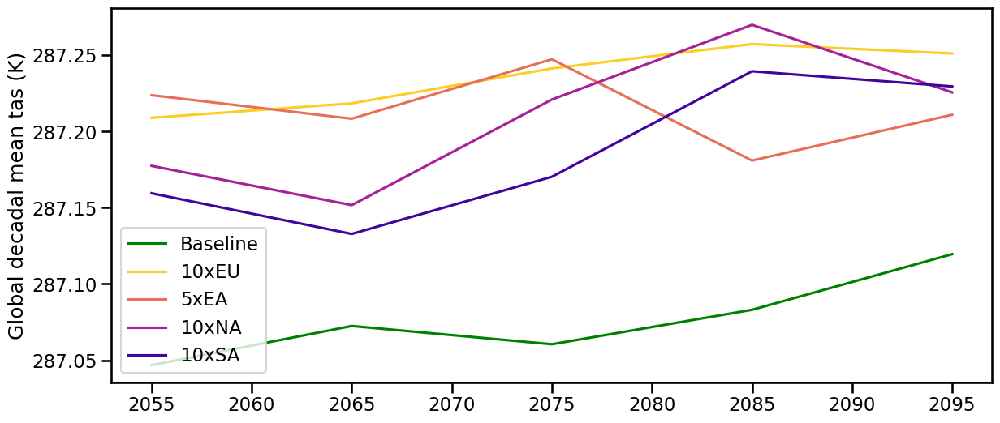

In [65]:
#sanity check global mean tas:
decade_bins = np.arange(2050, 2110, 10)
with sns.plotting_context('talk'):
    fig,ax = plt.subplots(1, 1, figsize=(14, 6))
    cmap = mpl.cm.plasma_r
    colors_bc = cmap(np.linspace(0.1,0.9,4))
    plt.plot(decade_bins[0:-1]+5, lat_weighted_mean(baseline_bc_tas.mean('ensemble_member').groupby_bins('year', bins=decade_bins).mean()), label='Baseline', color='g')
    plt.plot(decade_bins[0:-1]+5, lat_weighted_mean(eu10_bc_tas.mean('ensemble_member').groupby_bins('year', bins=decade_bins).mean()), label='10xEU', color=colors_bc[0])
    plt.plot(decade_bins[0:-1]+5, lat_weighted_mean(ea5_bc_tas.mean('ensemble_member').groupby_bins('year', bins=decade_bins).mean()), label='5xEA', color=colors_bc[1])
    plt.plot(decade_bins[0:-1]+5, lat_weighted_mean(na10_bc_tas.mean('ensemble_member').groupby_bins('year', bins=decade_bins).mean()), label='10xNA', color=colors_bc[2])
    plt.plot(decade_bins[0:-1]+5, lat_weighted_mean(sa10_bc_tas.mean('ensemble_member').groupby_bins('year', bins=decade_bins).mean()), label='10xSA', color=colors_bc[3])
    plt.legend()
    plt.ylabel('Global decadal mean tas (K)')


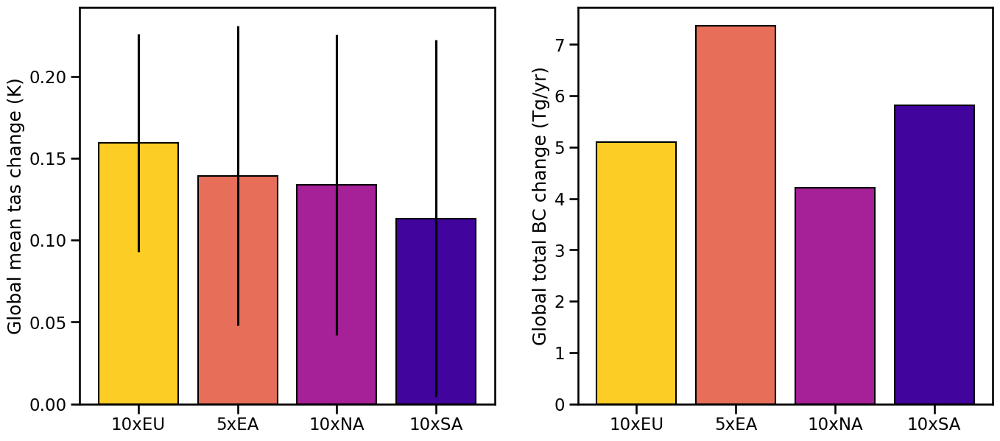

In [67]:
#plot tas change
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))

    experiments = ['10xEU','5xEA','10xNA','10xSA']
    tas_change = [lat_weighted_mean(eu10_bc_ds['tas_diff']), lat_weighted_mean(ea5_bc_ds['tas_diff']), lat_weighted_mean(na10_bc_ds['tas_diff']), lat_weighted_mean(sa10_bc_ds['tas_diff'])]
    emission_change = [Zeu10_bc.BC.sum(('lat','lon')), Zea5_bc.BC.sum(('lat','lon')), Zna10_bc.BC.sum(('lat','lon')), Zsa10_bc.BC.sum(('lat','lon'))]
    tas_std = [
        (lat_weighted_mean(eu10_bc_tas.mean('ensemble_member'))-lat_weighted_mean(baseline_bc_tas.mean('ensemble_member'))).std(),
        (lat_weighted_mean(ea5_bc_tas.mean('ensemble_member'))-lat_weighted_mean(baseline_bc_tas.mean('ensemble_member'))).std(),
        (lat_weighted_mean(na10_bc_tas.mean('ensemble_member'))-lat_weighted_mean(baseline_bc_tas.mean('ensemble_member'))).std(),
        (lat_weighted_mean(sa10_bc_tas.mean('ensemble_member'))-lat_weighted_mean(baseline_bc_tas.mean('ensemble_member'))).std()
    ]

    ax[0].bar(experiments, tas_change, yerr=tas_std, color=colors_bc, edgecolor='black')
    ax[0].set_ylabel('Global mean tas change (K)')

    ax[1].bar(experiments, emission_change, color=colors_bc, edgecolor='black')
    ax[1].set_ylabel('Global total BC change (Tg/yr)')


In [ ]:
#save plotting variables and statistics

#t-test on whole experiment:
eu10_bcstats_ds = ttest_equilibrium(eu10_bc_tas.mean('ensemble_member'), baseline_bc_tas.mean('ensemble_member')).assign_attrs(experiment_id = '10xEU BC only')
na10_bcstats_ds = ttest_equilibrium(na10_bc_tas.mean('ensemble_member'), baseline_bc_tas.mean('ensemble_member')).assign_attrs(experiment_id = '10xNA BC only')
sa10_bcstats_ds = ttest_equilibrium(sa10_bc_tas.mean('ensemble_member'), baseline_bc_tas.mean('ensemble_member')).assign_attrs(experiment_id = '10xSA BC only')
ea5_bcstats_ds = ttest_equilibrium(ea5_bc_tas.mean('ensemble_member'), baseline_bc_tas.mean('ensemble_member')).assign_attrs(experiment_id = '5xEA BC only')

if write_files:
    eu10_bcstats_ds.to_netcdf(out_dp+'stats_fdc_10xEU_BC.nc')
    na10_bcstats_ds.to_netcdf(out_dp+'stats_fdc_10xNA_BC.nc')
    sa10_bcstats_ds.to_netcdf(out_dp+'stats_fdc_10xSA_BC.nc')
    ea5_bcstats_ds.to_netcdf(out_dp+'stats_fdc_5xEA_BC.nc')

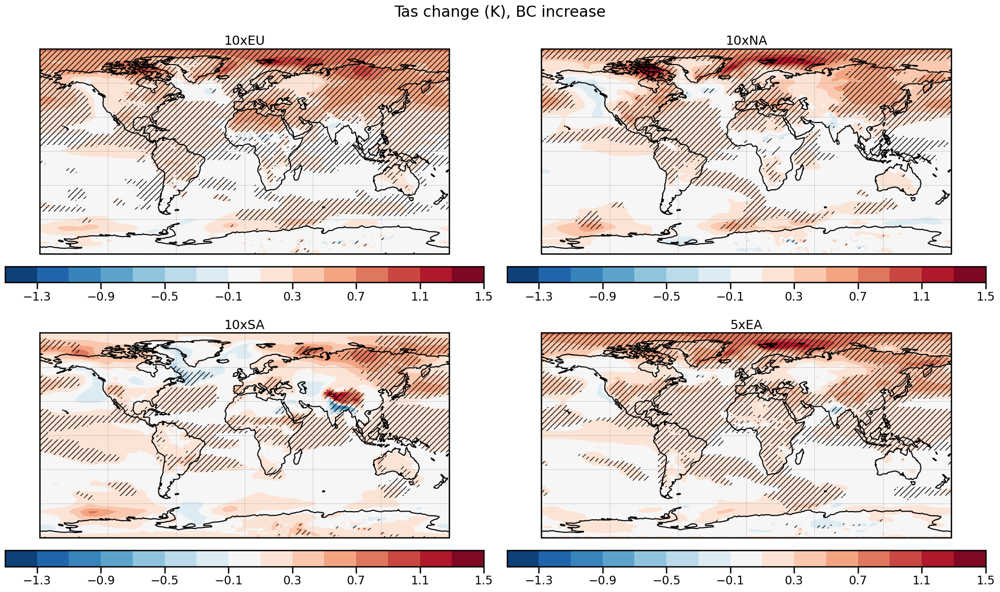

In [75]:
#maps

eu10pmask = np.ma.masked_greater(eu10_bcstats_ds['fdr_adjusted_p_values'], 0.05)
na10pmask = np.ma.masked_greater(na10_bcstats_ds['fdr_adjusted_p_values'], 0.05)
sa10pmask = np.ma.masked_greater(sa10_bcstats_ds['fdr_adjusted_p_values'], 0.05)
ea5pmask = np.ma.masked_greater(ea5_bcstats_ds['fdr_adjusted_p_values'], 0.05)
transform = ccrs.PlateCarree()
lats = eu10_bc_ds['lat']
lons = eu10_bc_ds['lon']
eu10bc_data, lons_ = add_cyclic_point(eu10_bc_ds['tas_diff'], coord=lons)
na10bc_data, lons_ = add_cyclic_point(na10_bc_ds['tas_diff'], coord=lons)
sa10bc_data, lons_ = add_cyclic_point(sa10_bc_ds['tas_diff'], coord=lons)
ea5bc_data, lons_ = add_cyclic_point(ea5_bc_ds['tas_diff'], coord=lons)

with sns.plotting_context('talk'):
    fig, axs = plt.subplots(nrows=2, ncols=2, subplot_kw={'projection': transform}, figsize=(20, 12))

    fig.suptitle('Tas change (K), BC increase')

    levels=np.linspace(-1.5, 1.5, 16)

    c1 = axs[0,0].contourf(lons_, lats, eu10bc_data, levels=levels, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,0].pcolor(lons_, lats, eu10pmask, hatch='///', alpha=0.)

    c2 = axs[0,1].contourf(lons_, lats, na10bc_data, levels=levels, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[0,1].pcolor(lons_, lats, na10pmask, hatch='///', alpha=0.)

    c3 = axs[1,0].contourf(lons_, lats, sa10bc_data, levels=levels, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,0].pcolor(lons_, lats, sa10pmask, hatch='///', alpha=0.)

    c4 = axs[1,1].contourf(lons_, lats, ea5bc_data, levels=levels, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0))
    axs[1,1].pcolor(lons_, lats, ea5pmask, hatch='///', alpha=0.)

    for ax,c,exp in zip(axs.flat,[c1, c2, c3, c4],['10xEU','10xNA','10xSA','5xEA']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=30)
        #cb.ax.tick_params(labelsize=16)
        ax.set_title(exp)

    fig.tight_layout()

# Total anthropogenic aerosol removal
0xBC, OC, SO2 globally simultaneously\
original experiments from: https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2017GL076079 (contact: maria.sand@cicero.oslo.no)

In [81]:
#inputs:
# Don't have emissions data for these experiments directly from NorESM output, so use CMIP5 historical emissions for 2000
# https://tntcat.iiasa.ac.at/RcpDb/dsd?Action=htmlpage&page=download

bc_emissions = xr.open_dataset(in_dp+'/AnthroAll/IPCC_emissions_BC_anthropogenic_2000_0.5x0.5_v1_21_05_2009.nc')
bc_emiss = bc_emissions['emiss_awb']+bc_emissions['emiss_dom']+bc_emissions['emiss_ene']+bc_emissions['emiss_ind']+bc_emissions['emiss_tra']+bc_emissions['emiss_wst']
bc_totemiss = ceds_regridder(bc_emiss.mean('time'))

oc_emissions = xr.open_dataset(in_dp+'/AnthroAll/IPCC_emissions_OC_anthropogenic_2000_0.5x0.5_v1_21_05_2009.nc')
oc_emiss = oc_emissions['emiss_awb']+oc_emissions['emiss_dom']+oc_emissions['emiss_ene']+oc_emissions['emiss_ind']+oc_emissions['emiss_tra']+oc_emissions['emiss_wst']
oc_totemiss = ceds_regridder(oc_emiss.mean('time'))

so2_emissions = xr.open_dataset(in_dp+'/AnthroAll/IPCC_emissions_SO2_anthropogenic_2000_0.5x0.5_v1_20_04_2009.nc')
so2_emiss = so2_emissions['emiss_awb']+so2_emissions['emiss_dom']+so2_emissions['emiss_ene']+so2_emissions['emiss_ind']+so2_emissions['emiss_tra']+so2_emissions['emiss_wst']
so2_totemiss = ceds_regridder(so2_emiss.mean('time'))

#merge species together:
emiss_merged = xr.merge([bc_totemiss.rename('BC'),oc_totemiss.rename('OC'),so2_totemiss.rename('SO2')])
emiss_merged = emiss_merged*grid_area*SECONDS_IN_YEAR*1e-9*-1 #convert to Tg/yr (minus 1 for total removal)
#emiss_merged = emiss_merged.expand_dims(dim={'year':len(anthro_ds.year)}).assign_coords(year=anthro_ds.year).squeeze(drop='True')
emiss_merged = emiss_merged.assign_attrs(units = 'Tg/yr', experiment_id = 'Global Anthro Removal')

if write_files:
    emiss_merged.to_netcdf('../training_data/inputs_global_anthro.nc')

/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable None as the horizontal dimensions for the regridding.
  warnings.warn(


/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable None as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable None as the horizontal dimensions for the regridding.
  warnings.warn(


In [77]:
#outputs:
baseline_anthro = xr.open_dataset(in_dp+'/AnthroAll/N_2000_15deg430ppmCO2.daily.0050-0100.V2.nc')['TREFHT'].sel(time=slice('0050-01-01','0099-12-31')) #baseline is 430ppm CO2, perturbation is enthro emissions to zero from that.
pert_ff_tas = xr.open_dataset(in_dp+'/AnthroAll/N_2000_15degnoffaero430ppmCO2.daily.0050-0100.V2.nc')['TREFHT'].sel(time=slice('0050-01-01','0099-12-31'))

#latitudes are not exacly equal (numerical issue, should be the same), so re-asign:
baseline_anthro['lat'] = noresm2_grid.lat
pert_ff_tas['lat'] = noresm2_grid.lat

#year 5 (0056) and year 31 (0086) have strangely low global mean tas in the baseline run, so we remove them.
#see tas plot below.
good_years = np.intersect1d(baseline_anthro.time.dt.year.where(~((baseline_anthro.time.dt.year==56) | (baseline_anthro.time.dt.year==86)), drop=True), pert_ff_tas.time.dt.year)
pert_ff_tas_good = pert_ff_tas.where(pert_ff_tas.time.dt.year.isin(good_years)).groupby('time.year').mean()
baseline_anthro_good = baseline_anthro.where(baseline_anthro.time.dt.year.isin(good_years)).groupby('time.year').mean()


anthro_tas = pert_ff_tas_good.mean('year') - baseline_anthro_good.mean('year')
anthro_var = pert_ff_tas_good.var('year') + baseline_anthro_good.var('year')

anthro_ds = xr.merge([anthro_tas.rename('tas_diff'),anthro_var.rename('diff_var')])
anthro_ds = anthro_ds.assign_attrs(units = 'K', experiment_id = 'Global Anthro Removal')

if write_files:
    anthro_ds.to_netcdf(out_dp+'outputs_global_anthro.nc')

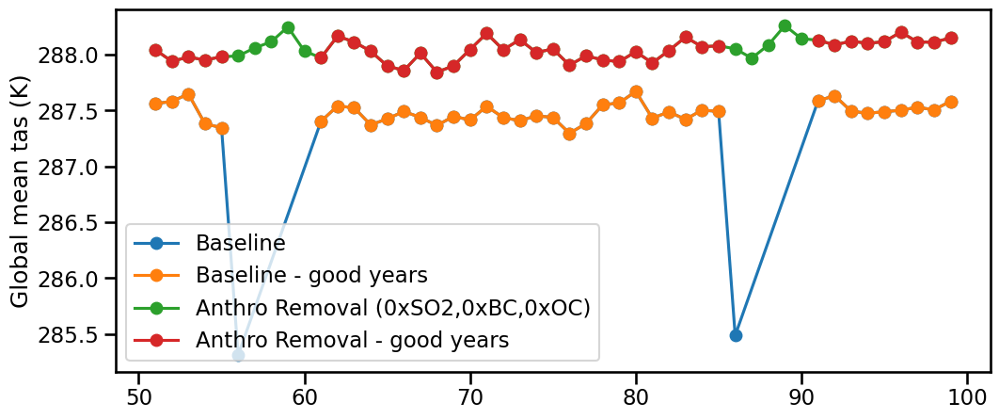

In [91]:
#sanity check global mean tas:
with sns.plotting_context('talk'):
    fig,ax = plt.subplots(1, 1, figsize=(12, 5))
    plt.plot(baseline_anthro.groupby('time.year').mean().year, lat_weighted_mean(baseline_anthro.groupby('time.year').mean()), label='Baseline', marker='o')
    plt.plot(baseline_anthro_good.year, lat_weighted_mean(baseline_anthro_good), label='Baseline - good years', marker='o')
    plt.plot(pert_ff_tas.groupby('time.year').mean().year, lat_weighted_mean(pert_ff_tas.groupby('time.year').mean()), label='Anthro Removal (0xSO2,0xBC,0xOC)', marker='o')
    plt.plot(pert_ff_tas_good.year, lat_weighted_mean(pert_ff_tas_good), label='Anthro Removal - good years', marker='o')
    plt.legend()
    plt.ylabel('Global mean tas (K)')  

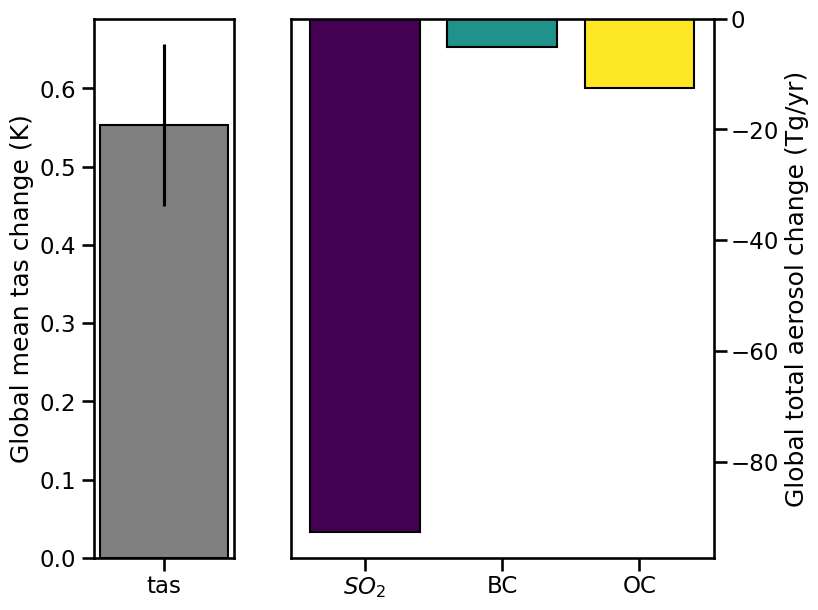

In [82]:
#plot tas and emissions change
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(8, 7), gridspec_kw={'width_ratios': [1,3]})

    species = ['$SO_{2}$','BC','OC']
    emission_change = [emiss_merged.SO2.sum(('lat','lon')), emiss_merged.BC.sum(('lat','lon')), emiss_merged.OC.sum(('lat','lon'))]

    ax[0].bar('tas', lat_weighted_mean(anthro_ds['tas_diff']), yerr=(lat_weighted_mean(pert_ff_tas_good) - lat_weighted_mean(baseline_anthro_good)).std() , width=0.1, edgecolor='black', color='gray')
    ax[0].set_ylabel('Global mean tas change (K)')

    ax[1].bar(species, emission_change, edgecolor='black', color=mpl.cm.viridis(np.linspace(0,1,3)))
    ax[1].set_ylabel('Global total aerosol change (Tg/yr)')
    ax[1].yaxis.set_label_position("right")
    ax[1].yaxis.tick_right()


In [ ]:
#save plotting variables and statistics

#t-test on whole experiment:
anthrostats_ds = ttest_equilibrium(pert_ff_tas_good, baseline_anthro_good).assign_attrs(experiment_id = 'Global Anthro Removal')

if write_files:
    anthrostats_ds.to_netcdf(out_dp+'stats_fdc_global_anthro.nc')

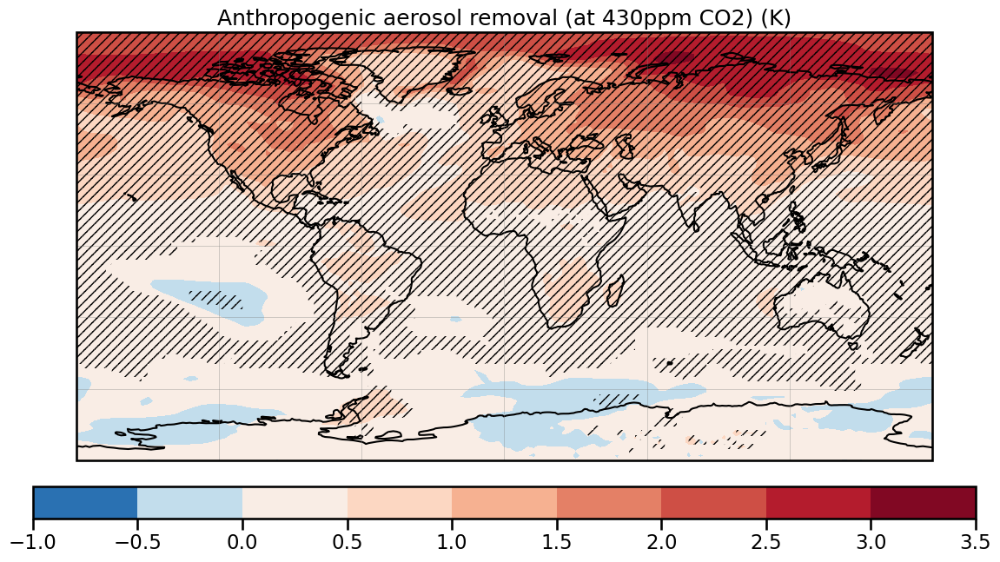

In [84]:
#plot maps of ensemble mean and significance:
pertpmask = np.ma.masked_greater(anthrostats_ds['fdr_adjusted_p_values'], 0.05)

transform = ccrs.PlateCarree()
lats = anthro_ds['lat']
lons = anthro_ds['lon']
anthro_data, lons_ = add_cyclic_point(anthro_ds['tas_diff'], coord=lons)

with sns.plotting_context('talk'):
        
    fig, ax = plt.subplots(nrows=1, ncols=1, subplot_kw={'projection': transform}, figsize=(14, 8))

    c=ax.contourf(lons_, lats, anthro_data, transform=transform, cmap='RdBu_r', norm=mpl.colors.TwoSlopeNorm(0))
    ax.pcolor(lons_, lats, pertpmask, hatch='///', alpha=0.)
    ax.coastlines()
    ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
    cb = plt.colorbar(c, ax=ax, orientation='horizontal', pad=0.05,aspect=30)
    ax.set_title('Anthropogenic aerosol removal (at 430ppm CO2) (K)')

# Individual aerosol removal
0xBC, 0xOC, 0xSO2 globally per species\
original experiments from:  https://acp.copernicus.org/articles/15/8201/2015/acp-15-8201-2015.html. (contacts: Laura Baker l.h.baker@reading.ac.uk and Johannes Quaas johannes.quaas@uni-leipzig.de)

In [86]:
#outputs:
baseline1_tas = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2REF1a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2REF1a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
baseline2_tas = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2REF2a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2REF2a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
baseline_2000_ = xr.concat([baseline1_tas, baseline2_tas], dim='realization')
baseline_2000_tas = baseline_2000_.mean(['year','realization'])
baseline_2000_tasvar = baseline_2000_.var(['year','realization'])

so2_remov_ = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2SO2GLOYEA1a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2SO2GLOYEA1a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
so2_remov_tas = (so2_remov_.mean('year') - baseline_2000_tas).rename('tas_diff')
so2_remov_tasvar = so2_remov_.var('year') + baseline_2000_tasvar
so2_remov_ds = xr.merge([so2_remov_tas,so2_remov_tasvar.rename('diff_var')])
so2_remov_ds = so2_remov_ds.assign_attrs(units = 'K', experiment_id = 'Global SO2 removal only')

bc_remov_tas1 = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2BCGLOYEA1a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2BCGLOYEA1a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
bc_remov_tas2 = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2BCGLOYEA2a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2BCGLOYEA2a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
bc_remov_ = xr.concat([bc_remov_tas1, bc_remov_tas2], dim='realization')
bc_remov_tas = (bc_remov_.mean(['year','realization']) - baseline_2000_tas).rename('tas_diff')
bc_remov_tasvar = bc_remov_.var(['year','realization']) + baseline_2000_tasvar
bc_remov_ds = xr.merge([bc_remov_tas,bc_remov_tasvar.rename('diff_var')])
bc_remov_ds = bc_remov_ds.assign_attrs(units = 'K', experiment_id = 'Global BC removal only')

oc_remov_ = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2OCGLOYEA1a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2OCGLOYEA1a.cam2.h0.2000-2055.nc')['TREFHT'].sel(time=slice('2000-01-01','2055-12-31')).groupby('time.year').mean()
oc_remov_tas = (oc_remov_.mean('year') - baseline_2000_tas).rename('tas_diff')
oc_remov_tasvar = oc_remov_.var('year') + baseline_2000_tasvar
oc_remov_ds = xr.merge([oc_remov_tas,oc_remov_tasvar.rename('diff_var')])
oc_remov_ds = oc_remov_ds.assign_attrs(units = 'K', experiment_id = 'Global OC removal only')


if write_files:
    so2_remov_ds.to_netcdf(out_dp+'outputs_global_SO2.nc')
    bc_remov_ds.to_netcdf(out_dp+'outputs_global_BC.nc')
    oc_remov_ds.to_netcdf(out_dp+'outputs_global_OC.nc')

In [ ]:
#save plotting variables and statistics

#t-test on whole experiment:
so2_removstats_ds = ttest_equilibrium(so2_remov_, baseline_2000_.mean('realization')).assign_attrs(experiment_id = 'Global SO2 removal only')
bc_removstats_ds = ttest_equilibrium(bc_remov_.mean('realization'), baseline_2000_.mean('realization')).assign_attrs(experiment_id = 'Global BC removal only')
oc_removstats_ds = ttest_equilibrium(oc_remov_, baseline_2000_.mean('realization')).assign_attrs(experiment_id = 'Global OC removal only')

if write_files:
    so2_removstats_ds.to_netcdf(out_dp+'stats_fdc_global_SO2.nc')
    bc_removstats_ds.to_netcdf(out_dp+'stats_fdc_global_BC.nc')
    oc_removstats_ds.to_netcdf(out_dp+'stats_fdc_global_OC.nc')

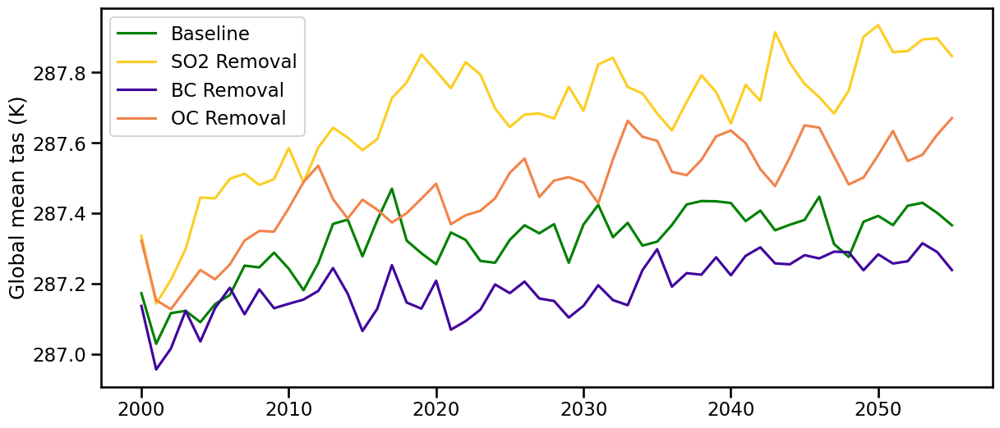

In [88]:
#sanity check global mean tas:
with sns.plotting_context('talk'):
    fig,ax = plt.subplots(1, 1, figsize=(14, 6))
    cmap = mpl.cm.plasma_r
    colors_remov = cmap([0.1,0.3,0.9])
    plt.plot(baseline_2000_.mean('realization').year, lat_weighted_mean(baseline_2000_.mean('realization')), label='Baseline', color='g')
    plt.plot(so2_remov_.year, lat_weighted_mean(so2_remov_), label='SO2 Removal', color=colors_remov[0])
    plt.plot(bc_remov_.mean('realization').year, lat_weighted_mean(bc_remov_.mean('realization')), label='BC Removal', color=colors_remov[2])
    plt.plot(oc_remov_.year, lat_weighted_mean(oc_remov_), label='OC Removal', color=colors_remov[1])
    plt.legend()
    plt.ylabel('Global mean tas (K)')  

In [89]:
#inputs:
#ECLIPSE website only has v4.0a for 2005 and 2010, so linearly interpolate to get 2008.
#regridded method for ECPLISE data is different, because ECLISPE units are kt/yr not fluxes, so upscaling the grid needs to be addative. 
#if the emissions are fluxes, then the values are independant of the size of the grid.

#setup regridder (pixel-for-pixel matching between inputs and outputs)
output_grid = xr.open_dataset(in_dp+'/AnthroIndv/TREFHT.N_2000_AER_cplon2REF1a.cam2.h0.2000-2055.ncTREFHT.N_2000_AER_cplon2REF1a.cam2.h0.2000-2055.nc')['TREFHT']
eclipse_grid = xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_SO2_2005.nc')['emis_all']
ec_regridder = xe.Regridder(get_bounds(eclipse_grid), get_bounds(output_grid), method='nearest_d2s', periodic=True)

so2_2005_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_SO2_2005.nc')['emis_all'])
bc_2005_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_BC_2005.nc')['emis_all'])
oc_2005_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_OC_2005.nc')['emis_all'])

so2_2010_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_SO2_2010.nc')['emis_all'])
bc_2010_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_BC_2010.nc')['emis_all'])
oc_2010_emiss = ec_regridder(xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_OC_2010.nc')['emis_all'])

#interpolate year:
so2_2008_emiss = so2_2005_emiss + (so2_2010_emiss-so2_2005_emiss)*(3/5)
bc_2008_emiss = bc_2005_emiss + (bc_2010_emiss-bc_2005_emiss)*(3/5)
oc_2008_emiss = oc_2005_emiss + (oc_2010_emiss-oc_2005_emiss)*(3/5)

#merge species together:
zero_emiss = so2_2008_emiss*0 #zero for species that aren't removed
so2_merged = xr.merge([so2_2008_emiss.rename('SO2')*-1,zero_emiss.rename('BC'),zero_emiss.rename('OC')])
#so2_merged = so2_merged.expand_dims(dim={'year':len(so2_remov_ds.year)}).assign_coords(year=so2_remov_ds.year).squeeze(drop='True')
so2_merged = so2_merged*0.001 #convert from kt/yr to Tg/yr
so2_merged = so2_merged.assign_attrs(units = 'Tg/yr', experiment_id = 'Global SO2 removal only')

bc_merged = xr.merge([zero_emiss.rename('SO2'),bc_2008_emiss.rename('BC')*-1,zero_emiss.rename('OC')])
#bc_merged = bc_merged.expand_dims(dim={'year':len(bc_remov_ds.year)}).assign_coords(year=bc_remov_ds.year).squeeze(drop='True')
bc_merged = bc_merged*0.001 #convert from kt/yr to Tg/yr
bc_merged = bc_merged.assign_attrs(units = 'Tg/yr', experiment_id = 'Global BC removal only')

oc_merged = xr.merge([zero_emiss.rename('SO2'),zero_emiss.rename('BC'),oc_2008_emiss.rename('OC')*-1])
#oc_merged = oc_merged.expand_dims(dim={'year':len(oc_remov_ds.year)}).assign_coords(year=oc_remov_ds.year).squeeze(drop='True')
oc_merged = oc_merged*0.001 #convert from kt/yr to Tg/yr
oc_merged = oc_merged.assign_attrs(units = 'Tg/yr', experiment_id = 'Global OC removal only')


if write_files:
    so2_merged.to_netcdf(out_dp+'inputs_global_SO2.nc')
    bc_merged.to_netcdf(out_dp+'inputs_global_BC.nc')
    oc_merged.to_netcdf(out_dp+'inputs_global_OC.nc')

/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable emis_all as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable emis_all as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable emis_all as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718: UserWarning: Using dimensions ('lat', 'lon') from data variable emis_all as the horizontal dimensions for the regridding.
  warnings.warn(
/home/x_maude/.conda/envs/ESMmenv_v2/lib/python3.13/site-packages/xesmf/frontend.py:718:

In [132]:
#check EC regridder is working: 
print('Regridded 2005 SO2: ', (so2_2005_emiss*0.001).sum(('lat','lon')).values)
print('Original 2005 SO2: ', (xr.open_dataset(in_dp+'/AnthroIndv/CP_WEO11_S10P50_v2_May13_SO2_2005.nc')['emis_all']*0.001).sum(('lat','lon')).values)

Regridded 2005 SO2:  99.86608299700002
Original 2005 SO2:  99.866082997


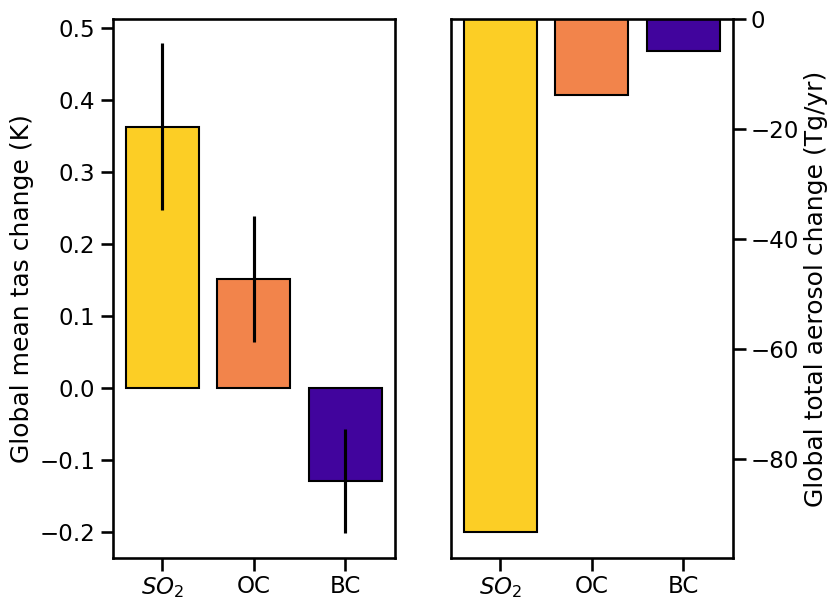

In [90]:
#plot tas and emissions change
with sns.plotting_context('talk'):
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(8, 7))

    species = ['$SO_{2}$','OC','BC']
    tas_change = [lat_weighted_mean(so2_remov_ds['tas_diff']), lat_weighted_mean(oc_remov_ds['tas_diff']), lat_weighted_mean(bc_remov_ds['tas_diff'])]
    emission_change = [so2_merged.SO2.sum(('lat','lon')), oc_merged.OC.sum(('lat','lon')), bc_merged.BC.sum(('lat','lon'))]
    tas_std = [
        (lat_weighted_mean(so2_remov_)-lat_weighted_mean(baseline_2000_.mean('realization'))).std(),
        (lat_weighted_mean(oc_remov_)-lat_weighted_mean(baseline_2000_.mean('realization'))).std(),
        (lat_weighted_mean(bc_remov_.mean('realization'))-lat_weighted_mean(baseline_2000_.mean('realization'))).std()
    ]

    ax[0].bar(species, tas_change, yerr=tas_std, edgecolor='black', color=colors_remov)
    ax[0].set_ylabel('Global mean tas change (K)')

    ax[1].bar(species, emission_change, edgecolor='black', color=colors_remov)
    ax[1].set_ylabel('Global total aerosol change (Tg/yr)')
    ax[1].yaxis.set_label_position("right")
    ax[1].yaxis.tick_right()

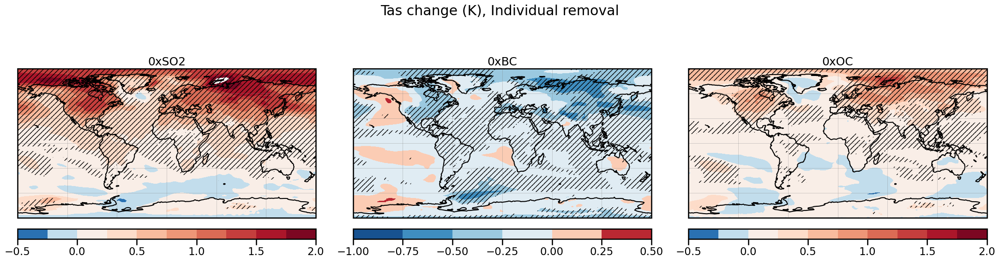

In [91]:
#maps

so2pmask = np.ma.masked_greater(so2_removstats_ds['fdr_adjusted_p_values'], 0.05)
bcpmask = np.ma.masked_greater(bc_removstats_ds['fdr_adjusted_p_values'], 0.05)
ocpmask = np.ma.masked_greater(oc_removstats_ds['fdr_adjusted_p_values'], 0.05)

transform = ccrs.PlateCarree()
lats = so2_remov_ds['lat']
lons = so2_remov_ds['lon']
so2_remov_data, lons_ = add_cyclic_point(so2_remov_ds['tas_diff'], coord=lons)
bc_remov_data, lons_ = add_cyclic_point(bc_remov_ds['tas_diff'], coord=lons)
oc_remov_data, lons_ = add_cyclic_point(oc_remov_ds['tas_diff'], coord=lons)
levels=np.linspace(-0.5, 2.0, 11)
levels2=np.linspace(-1.0, 0.5, 7)

with sns.plotting_context('talk'):
    fig, axs = plt.subplots(nrows=1, ncols=3, subplot_kw={'projection': transform}, figsize=(22, 6))

    fig.suptitle('Tas change (K), Individual removal')

    c1 = axs[0].contourf(lons_, lats, so2_remov_data, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0), levels=levels)
    axs[0].pcolor(lons_, lats, so2pmask, hatch='///', alpha=0.)
    plt.colorbar(c1, ax=axs[0], orientation='horizontal', pad=0.05,aspect=30)

    c2 = axs[1].contourf(lons_, lats, bc_remov_data, transform=transform, cmap='RdBu_r', norm=mpl.colors.TwoSlopeNorm(0), levels=levels2)
    axs[1].pcolor(lons_, lats, bcpmask, hatch='///', alpha=0.)
    plt.colorbar(c2, ax=axs[1], orientation='horizontal', pad=0.05,aspect=30)

    c3 = axs[2].contourf(lons_, lats, oc_remov_data, transform=transform, cmap='RdBu_r',norm=mpl.colors.TwoSlopeNorm(0), levels=levels)
    axs[2].pcolor(lons_, lats, ocpmask, hatch='///', alpha=0.)
    plt.colorbar(c3, ax=axs[2], orientation='horizontal', pad=0.05,aspect=30)

    for ax,c,exp in zip(axs.flat,[c1, c2, c3],['0xSO2','0xBC','0xOC']):
        ax.coastlines()
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', alpha=0.5)
        ax.set_title(exp)

    fig.tight_layout()

## Sanity Checks and Input data plots in plot_trainingdata.ipynb

In [21]:
#load data from 'out_dp'+latest/

def add_year(ds):
    #add experiment ID as a variable:
    #ds = ds.assign_coords(experiment_id = os.path.splitext(os.path.basename(ds.encoding['source']))[0].split('_',1)[1])
    print(ds.encoding['source'])
    print(ds.attrs)
    ds = ds.assign_coords(experiment = ds.attrs['experiment_id'])
    #add year as a coordinate to the dataset if it doesn't exist (ie for equilibrium runs where year is not a coordinate)
    if 'year' in ds.coords:
        return ds
    else:
        ds = ds.assign_coords(year=9999)
        ds = ds.expand_dims('year')
        return ds

inputs_ALL = xr.open_mfdataset(out_dp+'inputs_*.nc',combine='nested',concat_dim='year',preprocess=add_year)
outputs_ALL = xr.open_mfdataset(out_dp+'outputs_*.nc',combine='nested',concat_dim='year',preprocess=add_year)

/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_0xEA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xEA SO2 only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_0xEU_SO2.nc
{'emission units': 'Tg/yr', 'experiment_id': '0xEU SO2 only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_0xNA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xNA SO2 only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_0xSA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '0xSA SO2 only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_10xEU_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xEU BC only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_10xNA_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xNA BC only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_10xSA_BC.nc
{'units': 'Tg/yr', 'experiment_id': '10xSA BC only'}
/proj/bolinc/users/x_maude/AeroGP/training_data/inputs_10xSA_SO2.nc
{'units': 'Tg/yr', 'experiment_id': '10xSA SO2 only'}
/proj/bolinc/users/x_maude/Ae

In [22]:
#Sanity checks: make sure coordinates/dimension sizes are the same

total_years=0
exps = np.unique(inputs_ALL.experiment)
for ii in np.arange(len(exps)):
    print(exps[ii])
    print(inputs_ALL.where(inputs_ALL.experiment==exps[ii], drop=True)['SO2'].shape)
    print(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].shape)
    print('...')
    total_years = total_years+inputs_ALL.where(inputs_ALL.experiment==exps[ii], drop=True)['SO2'].shape[0]

print('Total training years: ', total_years)

0xEA SO2 only
(1, 96, 144)
(1, 96, 144)
...
0xEU SO2 only
(1, 96, 144)
(1, 96, 144)
...
0xNA SO2 only
(1, 96, 144)
(1, 96, 144)
...
0xSA SO2 only
(1, 96, 144)
(1, 96, 144)
...
10xEU BC only
(1, 96, 144)
(1, 96, 144)
...
10xNA BC only
(1, 96, 144)
(1, 96, 144)
...
10xSA BC only
(1, 96, 144)
(1, 96, 144)
...
10xSA SO2 only
(1, 96, 144)
(1, 96, 144)
...
5xEA BC only
(1, 96, 144)
(1, 96, 144)
...
5xEA SO2 only
(1, 96, 144)
(1, 96, 144)
...
5xNA SO2 only
(1, 96, 144)
(1, 96, 144)
...
7xEU SO2 only
(1, 96, 144)
(1, 96, 144)
...
AeroGP1
(30, 96, 144)
(30, 96, 144)
...
AeroGP2
(40, 96, 144)
(40, 96, 144)
...
Global Anthro Removal
(1, 96, 144)
(1, 96, 144)
...
Global BC removal only
(1, 96, 144)
(1, 96, 144)
...
Global OC removal only
(1, 96, 144)
(1, 96, 144)
...
Global SO2 removal only
(1, 96, 144)
(1, 96, 144)
...
RAMIP AF
(50, 96, 144)
(50, 96, 144)
...
RAMIP EA
(50, 96, 144)
(50, 96, 144)
...
RAMIP NAE
(50, 96, 144)
(50, 96, 144)
...
RAMIP SA
(50, 96, 144)
(50, 96, 144)
...
RAMIP T1: ssp12

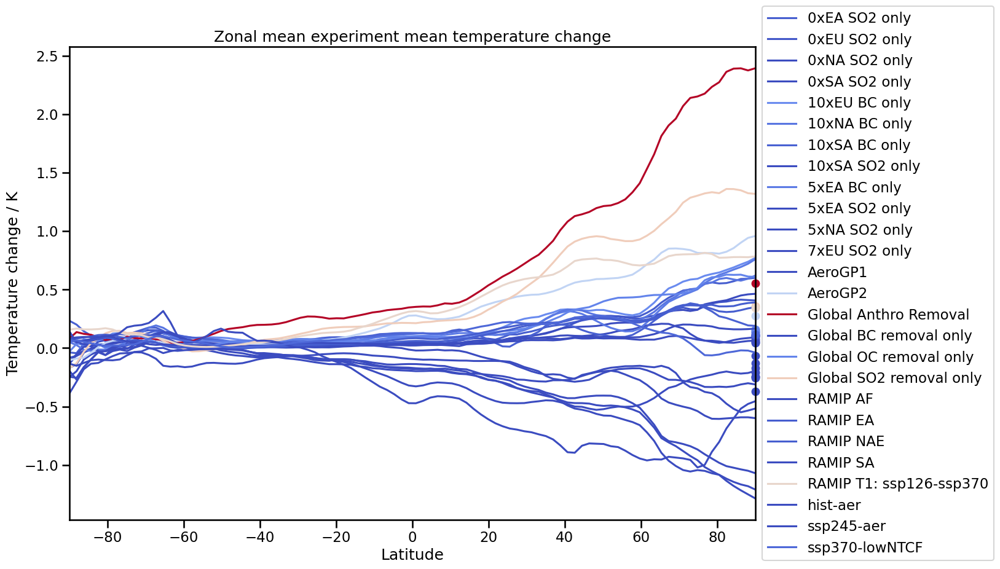

In [24]:
#Sanity checks. plot of zonal mean tas_diff of mean of all years:

#pick colors based on global mean tas ranking:
glb_tas = xr.DataArray(None, coords=[range(len(exps))], dims=['experiment'])
for ii in range(len(exps)):
    glb_tas[ii] = lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].mean('year'))

norm_tas=((2*(glb_tas-glb_tas.min())/(glb_tas.max()-glb_tas.min()))-1)

cmap = matplotlib.cm.get_cmap('coolwarm')
colors = cmap(tuple(norm_tas.astype(float)))

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 1, figsize=(18, 10))
    for ii in range(len(exps)):
        zonal_mean = outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].mean('year').mean('lon')
        plt.plot(zonal_mean.lat, zonal_mean, color=colors[ii], label=exps[ii])
        plt.plot(90,glb_tas[ii],color=colors[ii],marker='o',clip_on=False)
    plt.xlabel('Latitude')
    plt.ylabel('Temperature change / K')
    plt.title('Zonal mean experiment mean temperature change')
    plt.autoscale(enable=True, axis='x', tight=True)

    ax=plt.gca()
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

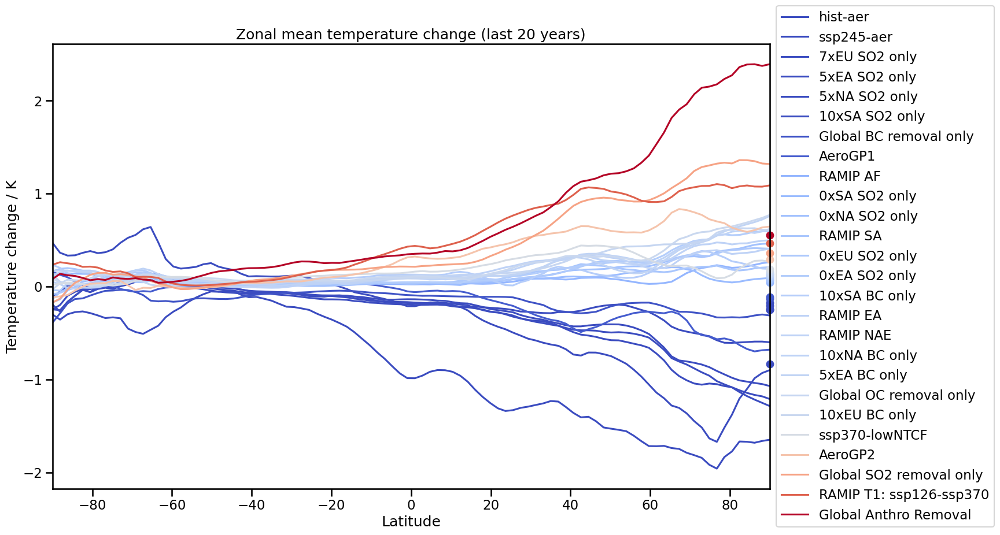

In [25]:
#Sanity checks. plot of zonal mean tas_diff of last 20 years for each experiment:

#pick colors based on global mean tas ranking:
glb_tas20 = xr.DataArray(None, coords=[range(len(exps))], dims=['experiment'])
for ii in range(len(exps)):
    glb_tas20[ii] = lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].isel(year=slice(-20,None)).mean('year')) 

glb_tas20_sorted = glb_tas20.sortby(glb_tas20)
norm_tas=((2*(glb_tas20-glb_tas20.min())/(glb_tas20.max()-glb_tas20.min()))-1)

cmap = matplotlib.cm.get_cmap('coolwarm')
colors = cmap(tuple(norm_tas.astype(float)))

with sns.plotting_context('talk'):
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    for ii in glb_tas20_sorted.experiment:
        zonal_mean = outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].isel(year=slice(-20,None)).mean('year').mean('lon')
        plt.plot(zonal_mean.lat, zonal_mean, color=colors[ii], label=exps[ii])
        plt.plot(90,glb_tas20[ii],color=colors[ii],marker='o',clip_on=False)
    plt.xlabel('Latitude')
    plt.ylabel('Temperature change / K')
    plt.title('Zonal mean temperature change (last 20 years)')
    plt.autoscale(enable=True, axis='x', tight=True)

    ax=plt.gca()
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [33]:
glb_var20 = xr.DataArray(None, coords=[range(len(exps))], dims=['experiment'])
for ii in range(len(exps)):
    glb_var20[ii] = lat_weighted_mean(outputs_ALL.where(outputs_ALL.experiment==exps[ii], drop=True)['tas_diff'].isel(year=slice(-20,None))).var('year')

In [27]:
glb_tas20_sorted.experiment

<xarray.DataArray 'experiment' (experiment: 26)>
array([23, 24, 11,  9, 10,  7, 15, 12, 18,  3,  2, 21,  1,  0,  6, 19, 20,  5,
        8, 16,  4, 25, 13, 17, 22, 14])
Coordinates:
  * experiment  (experiment) int64 23 24 11 9 10 7 15 12 ... 16 4 25 13 17 22 14

In [30]:
exps[14]

'Global Anthro Removal'

In [31]:
glb_tas20[14]

<xarray.DataArray ()>
array(0.5527819007666324, dtype=object)
Coordinates:
    experiment  int64 14

In [39]:
anthro_stats = xr.open_dataset(out_dp+'stats_global_anthro.nc')

In [42]:
anthro_stats

<xarray.Dataset>
Dimensions:   (lat: 96, lon: 144, dim_0: 96, dim_1: 144)
Coordinates:
  * lat       (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * lon       (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Dimensions without coordinates: dim_0, dim_1
Data variables:
    tas_diff  (lat, lon) float32 -0.006638 0.1892 0.2533 ... 2.383 2.383 2.383
    diff_var  (lat, lon) float32 1.074 1.13 1.074 1.069 ... 1.77 1.776 1.781
    t_val     (dim_0, dim_1) float64 -0.03947 1.097 1.507 ... 11.04 11.02 11.01
    p_val     (dim_0, dim_1) float64 0.9686 0.2762 ... 2.981e-17 3.173e-17
Attributes:
    units:          K
    experiment_id:  Global Anthro Removal

In [43]:
lat_weighted_mean(anthro_stats['tas_diff'])

<xarray.DataArray 'tas_diff' ()>
array(0.5527819)

In [44]:
lat_weighted_mean(anthro_stats['diff_var'])

<xarray.DataArray 'diff_var' ()>
array(0.60371514)